<a href="https://colab.research.google.com/github/canmizrakli/TDYSN/blob/main/TDSal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# YOLO-based Task-driven Visual Saliency Prediction



This notebook demonstrates a complete workflow for building a YOLO-based architecture for task-based visual saliency prediction.

**Dataset Structure**  
Your dataset (stored on Google Drive at `/content/drive/MyDrive/TDSP/Task-based-eye-fixation-dataset_1024x768`) should be organized as follows:



**Task Definitions**  
- **task1** → free view  
- **task2** → count people  
- **task3** → detect the emotion  
- **task4** → identify the action

The notebook includes:  
- Paired data augmentation  
- A YOLO-based backbone (pre-trained)  
- A TaskEncoder using Sentence-BERT for rich task embeddings  
- A saliency-specific loss function

## Preprocessing

In [ ]:
# 1. Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# 2. Install Dependencies
!pip install --upgrade torch torchvision einops
!pip install ultralytics

### Data Augmentation & Paired Transforms

Implement custom paired transforms so that random flips and rotations are applied identically to both the input image and its saliency map.

In [ ]:
import random
import torchvision.transforms.functional as TF  # Use TF to avoid conflicts with torch.nn.functional

# Paired random horizontal flip
class PairedRandomHorizontalFlip:
    def __init__(self, p=0.5):
        self.p = p

    def __call__(self, img, sal):
        if random.random() < self.p:
            img = TF.hflip(img)
            sal = TF.hflip(sal)
        return img, sal

# Paired random rotation
class PairedRandomRotation:
    def __init__(self, degrees=10):
        self.degrees = degrees

    def __call__(self, img, sal):
        angle = random.uniform(-self.degrees, self.degrees)
        img = TF.rotate(img, angle)
        sal = TF.rotate(sal, angle)
        return img, sal

## Dataset Definition

Create a custom PyTorch Dataset to load stimuli images with their corresponding saliency maps for each task, apply preprocessing transforms and paired augmentations, and wrap it in a DataLoader.

In [ ]:
import os
import glob
import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms as T

# Define task mapping from folder names to descriptive labels.
task_mapping = {
    "task1": "free view",
    "task2": "count people",
    "task3": "detect the emotion",
    "task4": "identify the action"
}

class TaskSaliencyDataset(Dataset):
    def __init__(self, data_root, task_mapping, transform=None, saliency_transform=None, paired_transforms=None):
        """
        data_root: Root path of the dataset.
        task_mapping: Dictionary mapping task folder names (e.g., "task1") to task descriptions.
        transform: Transforms for stimuli images (e.g., resizing, ToTensor).
        saliency_transform: Transforms for saliency maps.
        paired_transforms: List of callables that apply the same random transform to both stimuli and saliency.
        """
        self.data_root = data_root
        self.task_mapping = task_mapping
        self.transform = transform
        self.saliency_transform = saliency_transform
        self.paired_transforms = paired_transforms

        self.tasks = list(task_mapping.keys())
        self.samples = []

        # Iterate over each task folder and gather samples
        for task in self.tasks:
            task_folder = os.path.join(data_root, task)
            fdm_folder = os.path.join(task_folder, "fdm")
            fdm_files = glob.glob(os.path.join(fdm_folder, "*.png"))
            for fdm_file in fdm_files:
                filename = os.path.basename(fdm_file)
                base = os.path.splitext(filename)[0]
                # Look for corresponding stimuli image (.jpg or .png)
                stimuli_path_jpg = os.path.join(data_root, "stimuli", base + ".jpg")
                stimuli_path_png = os.path.join(data_root, "stimuli", base + ".png")
                if os.path.exists(stimuli_path_jpg):
                    stimuli_path = stimuli_path_jpg
                elif os.path.exists(stimuli_path_png):
                    stimuli_path = stimuli_path_png
                else:
                    continue
                self.samples.append((stimuli_path, fdm_file, task))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        stimuli_path, fdm_path, task = self.samples[idx]
        stimuli_img = Image.open(stimuli_path).convert("RGB")
        fdm_img = Image.open(fdm_path).convert("L")

        if self.transform:
            stimuli_img = self.transform(stimuli_img)
        if self.saliency_transform:
            fdm_img = self.saliency_transform(fdm_img)
        else:
            fdm_img = T.ToTensor()(fdm_img)

        # Apply paired transforms if defined
        if self.paired_transforms is not None:
            for t in self.paired_transforms:
                stimuli_img, fdm_img = t(stimuli_img, fdm_img)

        task_description = self.task_mapping[task]

        return {
            "stimuli": stimuli_img,
            "fdm": fdm_img,
            "task": task,
            "task_description": task_description
        }

# Define transforms
input_transform = T.Compose([
    T.Resize((384, 384)),
    T.ToTensor(),
])
saliency_transform = T.Compose([
    T.Resize((384, 384)),
    T.ToTensor(),
])
paired_transforms = [
    PairedRandomHorizontalFlip(p=0.5),
    PairedRandomRotation(degrees=10)
]

# Path to your dataset (adjust the path if needed)
DATA_PATH = "/content/drive/MyDrive/TDYSN/Task-based-eye-fixation-dataset_1024x768"

dataset = TaskSaliencyDataset(
    data_root=DATA_PATH,
    task_mapping=task_mapping,
    transform=input_transform,
    saliency_transform=saliency_transform,
    paired_transforms=paired_transforms
)
dataloader = DataLoader(dataset, batch_size=8, shuffle=True, num_workers=0)

print("Tasks found:", dataset.tasks)
print("Number of samples:", len(dataset))


Tasks found: ['task1', 'task2', 'task3', 'task4']
Number of samples: 1968


### Train/Test/Val Splits

Split the dataset into 70/15/15 train/validation/test subsets with a fixed random seed and wrap each in a DataLoader.

In [ ]:
from torch.utils.data import random_split, DataLoader
import torch

total_size = len(dataset)
train_size = int(0.70 * total_size)
val_size   = int(0.15 * total_size)
test_size  = total_size - train_size - val_size

# for reproducibility
generator = torch.Generator().manual_seed(42)

train_ds, val_ds, test_ds = random_split(
    dataset,
    [train_size, val_size, test_size],
    generator=generator
)

train_loader = DataLoader(train_ds, batch_size=8, shuffle=True,  num_workers=4)
val_loader   = DataLoader(val_ds,   batch_size=8, shuffle=False, num_workers=4)
test_loader  = DataLoader(test_ds,  batch_size=8, shuffle=False, num_workers=4)

print(f"Train / Val / Test sizes: {len(train_ds)} / {len(val_ds)} / {len(test_ds)}")


Train / Val / Test sizes: 1377 / 295 / 296


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


## Model Components

Imports

In [ ]:
import torch.nn as nn
import torch.nn.functional as F
from einops import rearrange
from ultralytics import YOLO
from sentence_transformers import SentenceTransformer

###1. Pre-trained YOLO Backbone


A YOLO (YOLOv5) model with its final detection layers removed, leaving only the feature extraction layers. This part extracts deep visual features from the input image.

In [ ]:
class YOLOBackbone(nn.Module):
    def __init__(self, model_name="yolov5su.pt"):
        super().__init__()
        # Load pre-trained YOLO model by specifying the weight file
        self.yolo_model = YOLO(model_name)
        # Retain only the feature extraction layers (adjust slicing as needed)
        self.feature_extractor = self.yolo_model.model.model[:10]

    def forward(self, x):
        return self.feature_extractor(x)

    def train(self, mode=True):
        # Override train method to only set training mode on the feature extractor
        self.feature_extractor.train(mode)
        return self

### 2. Feature Projection Module (FPM)




Use a 1×1 convolution to reduce the backbone feature map’s channel dimension for subsequent fusion and decoding.

In [ ]:
class SimpleFPN(nn.Module):
    def __init__(self, in_channels=512, out_channels=128):
        super().__init__()
        self.conv_out = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, backbone_feats):
        x = self.conv_out(backbone_feats)
        return x

### 3. Task Encoder



Uses Sentence-BERT to convert a short text description (e.g., “count people”) into a dense embedding (e.g., 64 dimensions). This embedding captures semantic information about the task.

In [ ]:
class TaskEncoder(nn.Module):
    def __init__(self, output_dim=64):
        super().__init__()
        self.text_encoder = SentenceTransformer('all-MiniLM-L6-v2')
        # Sentence-BERT outputs 384-dimensional embeddings; reduce to output_dim.
        self.linear = nn.Linear(384, output_dim)

    def forward(self, task_descriptions):
        # Process a list of task description strings
        embeddings = self.text_encoder.encode(task_descriptions, convert_to_tensor=True)
        embeddings = self.linear(embeddings)
        return F.relu(embeddings)

###4. Transformer Fusion Module



Fuse visual features with the task embedding via a lightweight transformer encoder.

**How it works**  
1. **Flattening**  
   Reshape the 2D feature map into a sequence of tokens.  
2. **Task Token**  
   Project the task embedding into the same feature space and prepend it as a special token.  
3. **Encoding**  
   Run the combined sequence through a TransformerEncoder to integrate image and task context.  
4. **Reshaping**  
   Convert the enriched token sequence back into a 2D feature map for the decoder.

In [ ]:
class TransformerFusion(nn.Module):
    def __init__(self, d_model=128, nhead=4, num_layers=1, task_embed_dim=64):
        super().__init__()
        self.query_proj = nn.Linear(task_embed_dim, d_model)
        encoder_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead)
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

    def forward(self, vision_feats, task_embed):
        B, C, H, W = vision_feats.shape
        vision_seq = rearrange(vision_feats, 'b c h w -> (h w) b c')
        task_query = self.query_proj(task_embed)
        task_query = rearrange(task_query, 'b d -> 1 b d')
        fused_seq = torch.cat([task_query, vision_seq], dim=0)
        encoded_seq = self.transformer_encoder(fused_seq)
        encoded_vision = encoded_seq[1:, :, :]
        encoded_vision = rearrange(encoded_vision, '(h w) b c -> b c h w', h=H, w=W)
        return encoded_vision

###5. Saliency Decoder



Three convolutional blocks with ReLU activations and transposed-conv upsampling to go from fused features → single-channel map, then a final sigmoid to constrain values to [0,1].

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class SaliencyDecoder(nn.Module):
    def __init__(self, in_channels: int):
        super().__init__()
        # 1) bring feature channels down
        self.conv1   = nn.Conv2d(in_channels,  64, kernel_size=3, padding=1)
        # 2) upsample ×2
        self.deconv1 = nn.ConvTranspose2d(64,        32,
                                          kernel_size=4, stride=2, padding=1)
        # 3) upsample ×2 again (so total ×4 from the FPN resolution)
        self.deconv2 = nn.ConvTranspose2d(32,         1,
                                          kernel_size=4, stride=2, padding=1)

    def forward(self, x):
        # x is [B, vision_dim, H′, W′] coming out of your transformer
        x = F.relu(self.conv1(x))      # still [B,64,H′,W′]
        x = F.relu(self.deconv1(x))    # [B,32,2H′,2W′]
        x =       self.deconv2(x)      # [B, 1,4H′,4W′]
        return torch.sigmoid(x)        # now a full‐resolution map if 4H′=H_inp

###6. The Complete Model: YOLOTaskSaliencyModel

Assemble the backbone, FPN, task encoder, transformer fusion, and decoder into a single end-to-end saliency prediction network.

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 6.6 Complete Model: YOLOTaskSaliencyModel
class YOLOTaskSaliencyModel(nn.Module):
    def __init__(self, task_embed_dim=64, vision_dim=128, nhead=4, num_layers=1):
        super().__init__()
        self.backbone = YOLOBackbone(model_name="yolov5s.pt")
        self.fpn = SimpleFPN(in_channels=512, out_channels=128)  # Updated here
        self.task_encoder = TaskEncoder(output_dim=task_embed_dim)
        self.transformer_fusion = TransformerFusion(d_model=vision_dim, nhead=nhead,
                                                    num_layers=num_layers, task_embed_dim=task_embed_dim)
        self.saliency_decoder = SaliencyDecoder(in_channels=vision_dim)

    def forward(self, images, task_descriptions):
        feat = self.backbone(images)          # Output shape: [B, 512, H/?, W/?]
        feat = self.fpn(feat)                 # Now shape becomes [B, 128, H/?, W/?]
        task_embed = self.task_encoder(task_descriptions)  # [B, task_embed_dim]
        fused_feat = self.transformer_fusion(feat, task_embed)  # [B, 128, H/?, W/?]
        saliency_map = self.saliency_decoder(fused_feat)  # [B, 1, H/?, W/?]
        return saliency_map

## Loss Function

A custom loss combining KL Divergence and (1 - Pearson’s Correlation Coefficient). Encourages the predicted map to match the ground-truth saliency distribution while being correlated with it spatially.

In [ ]:
class SaliencyLoss(nn.Module):
    def __init__(self, alpha=1.0, beta=1.0):
        """
        alpha: Weight for the KL Divergence term.
        beta: Weight for (1 - Pearson's Correlation Coefficient) term.
        """
        super().__init__()
        self.alpha = alpha
        self.beta = beta

    def forward(self, pred, gt):
        # Ensure shape is [B, H, W]
        if len(pred.shape) == 4:
            pred = pred[:, 0]
        if len(gt.shape) == 4:
            gt = gt[:, 0]

        B, H, W = pred.shape
        pred = pred.reshape(B, -1)
        gt = gt.reshape(B, -1)
        eps = 1e-12
        pred_norm = pred / (pred.sum(dim=1, keepdim=True) + eps)
        gt_norm = gt / (gt.sum(dim=1, keepdim=True) + eps)

        # KL Divergence: sum(gt * log(gt/pred))
        kl = (gt_norm * torch.log((gt_norm + eps) / (pred_norm + eps))).sum(dim=1).mean()

        # Pearson's Correlation Coefficient (CC)
        pred_mean = pred.mean(dim=1, keepdim=True)
        gt_mean = gt.mean(dim=1, keepdim=True)
        numerator = ((pred - pred_mean) * (gt - gt_mean)).sum(dim=1)
        denominator = torch.sqrt(((pred - pred_mean)**2).sum(dim=1) * ((gt - gt_mean)**2).sum(dim=1)) + eps
        cc = (numerator / denominator).mean()

        loss = self.alpha * kl + self.beta * (1 - cc)
        return loss

## Training

In [ ]:
import torch.optim as optim

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
lr = 1e-4
num_epochs = 50

model = YOLOTaskSaliencyModel().to(device)
optimizer = optim.Adam(model.parameters(), lr=lr)
criterion = SaliencyLoss(alpha=1.0, beta=1.0)

PRO TIP 💡 Replace 'model=yolov5s.pt' with new 'model=yolov5su.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



In [ ]:
print(model)

YOLOTaskSaliencyModel(
  (backbone): YOLOBackbone(
    (yolo_model): YOLO(
      (model): DetectionModel(
        (model): Sequential(
          (0): Conv(
            (conv): Conv2d(3, 32, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2), bias=False)
            (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
            (act): SiLU(inplace=True)
          )
          (1): Conv(
            (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
            (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
            (act): SiLU(inplace=True)
          )
          (2): C3(
            (cv1): Conv(
              (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
              (act): SiLU(inplace=True)
            )
            (cv2): Conv(
              (conv): 

In [ ]:
print("Batch size:", train_loader.batch_size)

Batch size: 8


### Training with per-epoch loss visualization for better evaluation

Epoch [1/30], Batch [30/173] Loss: 2.5677
Epoch [1/30], Batch [60/173] Loss: 2.3349
Epoch [1/30], Batch [90/173] Loss: 2.2348
Epoch [1/30], Batch [120/173] Loss: 1.9644
Epoch [1/30], Batch [150/173] Loss: 1.8414
Epoch [1/30] Average Loss: 2.2555
Epoch [2/30], Batch [30/173] Loss: 1.7780
Epoch [2/30], Batch [60/173] Loss: 1.8175
Epoch [2/30], Batch [90/173] Loss: 1.6003
Epoch [2/30], Batch [120/173] Loss: 1.6471
Epoch [2/30], Batch [150/173] Loss: 1.4825
Epoch [2/30] Average Loss: 1.6966
Epoch [3/30], Batch [30/173] Loss: 1.6669
Epoch [3/30], Batch [60/173] Loss: 1.7140
Epoch [3/30], Batch [90/173] Loss: 1.4323
Epoch [3/30], Batch [120/173] Loss: 1.7119
Epoch [3/30], Batch [150/173] Loss: 1.5273
Epoch [3/30] Average Loss: 1.6034
Epoch [4/30], Batch [30/173] Loss: 1.3806
Epoch [4/30], Batch [60/173] Loss: 1.5023
Epoch [4/30], Batch [90/173] Loss: 1.6913
Epoch [4/30], Batch [120/173] Loss: 1.4434
Epoch [4/30], Batch [150/173] Loss: 1.4257
Epoch [4/30] Average Loss: 1.5606
Epoch [5/30], Ba

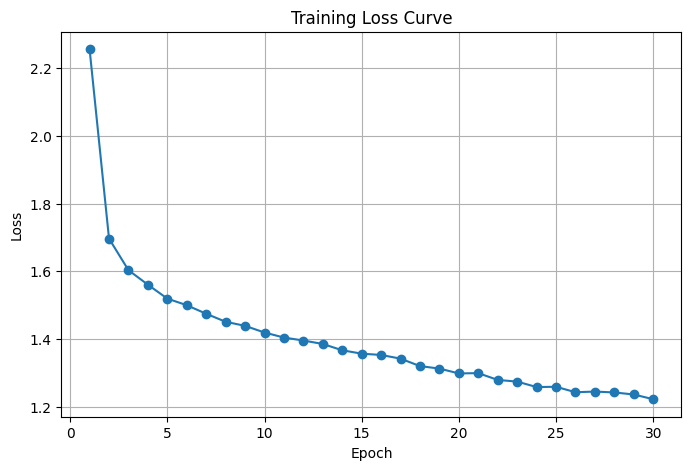

In [ ]:
import matplotlib.pyplot as plt  # Add at the top

epoch_losses = []  # Track average loss per epoch
val_metrics_per_epoch = {
    "CC": [], "KL": [], "SIM": [], "NSS": [], "AUC-Borji": []
}

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for batch_idx, batch_data in enumerate(train_loader):
        images = batch_data["stimuli"].to(device)
        fdm = batch_data["fdm"].to(device)
        task_descs = batch_data["task_description"]

        optimizer.zero_grad()
        pred_saliency = model(images, task_descs)
        pred_small = F.interpolate(pred_saliency, size=fdm.shape[-2:], mode='bilinear', align_corners=False)
        loss = criterion(pred_small, fdm)

        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        if (batch_idx + 1) % 30 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(train_loader)}] Loss: {loss.item():.4f}", flush=True)

    epoch_loss = running_loss / len(train_loader)
    epoch_losses.append(epoch_loss)  # Append to list
    print(f"Epoch [{epoch+1}/{num_epochs}] Average Loss: {epoch_loss:.4f}", flush=True)

# Plot after training
plt.figure(figsize=(8,5))
plt.plot(range(1, num_epochs+1), epoch_losses, marker='o')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Loss Curve")
plt.grid(True)
plt.show()

###Validation Plot Training

In [ ]:
import matplotlib.pyplot as plt

# Initialize lists
epoch_losses = []  # Track training loss
val_metrics_per_epoch = {
    "CC": [], "KL": [], "SIM": [], "NSS": [], "AUC-Borji": []
}

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for batch_idx, batch_data in enumerate(train_loader):
        images = batch_data["stimuli"].to(device)
        fdm = batch_data["fdm"].to(device)
        task_descs = batch_data["task_description"]

        optimizer.zero_grad()
        pred_saliency = model(images, task_descs)
        pred_small = F.interpolate(pred_saliency, size=fdm.shape[-2:], mode='bilinear', align_corners=False)
        loss = criterion(pred_small, fdm)

        loss.backward()
        optimizer.step()
        running_loss += loss.item()

        if (batch_idx + 1) % 30 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(train_loader)}] Loss: {loss.item():.4f}", flush=True)

    # 🔹 After training for one epoch
    epoch_loss = running_loss / len(train_loader)
    epoch_losses.append(epoch_loss)
    print(f"Epoch [{epoch+1}/{num_epochs}] Avg Training Loss: {epoch_loss:.4f}", flush=True)

    # 🔹 Validation Evaluation
    val_metrics = evaluate_saliency_model(model, val_loader, device)
    for key in val_metrics:
        val_metrics_per_epoch[key].append(val_metrics[key])

Epoch [1/50], Batch [30/173] Loss: 2.5102
Epoch [1/50], Batch [60/173] Loss: 2.3064
Epoch [1/50], Batch [90/173] Loss: 1.9025
Epoch [1/50], Batch [120/173] Loss: 1.6330
Epoch [1/50], Batch [150/173] Loss: 1.9521
Epoch [1/50] Avg Training Loss: 2.0185
Average CC:         0.5153
Average KLDiv:      1.2336
Average Similarity: 0.4063
Average NSS:        2.4568
Average AUC-Borji:  0.9138
Epoch [2/50], Batch [30/173] Loss: 1.7078
Epoch [2/50], Batch [60/173] Loss: 1.9690
Epoch [2/50], Batch [90/173] Loss: 1.6430
Epoch [2/50], Batch [120/173] Loss: 1.6014
Epoch [2/50], Batch [150/173] Loss: 1.6262
Epoch [2/50] Avg Training Loss: 1.6631
Average CC:         0.5418
Average KLDiv:      1.1539
Average Similarity: 0.4282
Average NSS:        2.6904
Average AUC-Borji:  0.9248
Epoch [3/50], Batch [30/173] Loss: 1.4578
Epoch [3/50], Batch [60/173] Loss: 1.4789
Epoch [3/50], Batch [90/173] Loss: 1.5182
Epoch [3/50], Batch [120/173] Loss: 1.4064
Epoch [3/50], Batch [150/173] Loss: 1.6355
Epoch [3/50] Avg

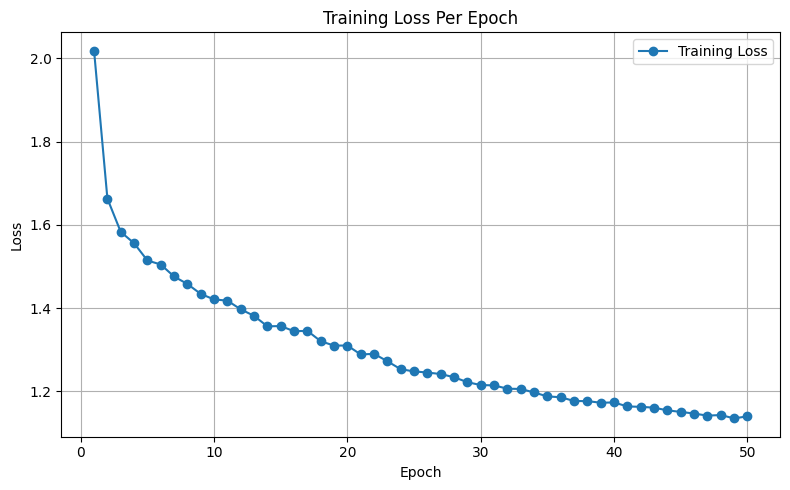

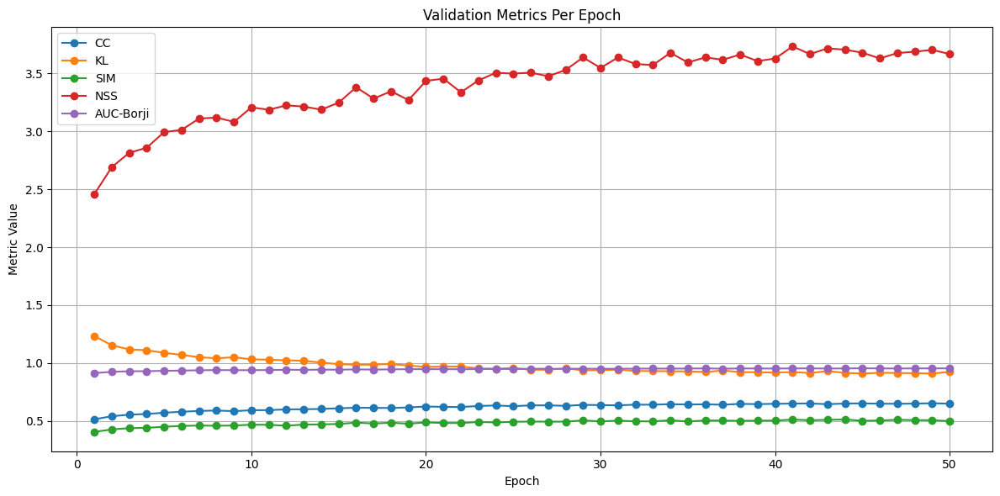

In [ ]:
epochs = range(1, num_epochs + 1)

# 🔹 1. Plot Training Loss
plt.figure(figsize=(8, 5))
plt.plot(epochs, epoch_losses, marker='o', label="Training Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Loss Per Epoch")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# 🔹 2. Plot Validation Metrics
plt.figure(figsize=(12, 6))
for metric in val_metrics_per_epoch:
    plt.plot(epochs, val_metrics_per_epoch[metric], marker='o', label=metric)

plt.xlabel("Epoch")
plt.ylabel("Metric Value")
plt.title("Validation Metrics Per Epoch")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

###Validation Plot Training - Test Dataset

In [ ]:
import matplotlib.pyplot as plt

# Initialize lists
epoch_losses = []  # Track training loss
val_metrics_per_epoch = {
    "CC": [], "KL": [], "SIM": [], "NSS": [], "AUC-Borji": []
}

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for batch_idx, batch_data in enumerate(train_loader):
        images = batch_data["stimuli"].to(device)
        fdm = batch_data["fdm"].to(device)
        task_descs = batch_data["task_description"]

        optimizer.zero_grad()
        pred_saliency = model(images, task_descs)
        pred_small = F.interpolate(pred_saliency, size=fdm.shape[-2:], mode='bilinear', align_corners=False)
        loss = criterion(pred_small, fdm)

        loss.backward()
        optimizer.step()
        running_loss += loss.item()

        if (batch_idx + 1) % 30 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(train_loader)}] Loss: {loss.item():.4f}", flush=True)

    # 🔹 After training for one epoch
    epoch_loss = running_loss / len(train_loader)
    epoch_losses.append(epoch_loss)
    print(f"Epoch [{epoch+1}/{num_epochs}] Avg Training Loss: {epoch_loss:.4f}", flush=True)

    # 🔹 Validation Evaluation
    val_metrics = evaluate_saliency_model(model, test_loader, device)
    for key in val_metrics:
        val_metrics_per_epoch[key].append(val_metrics[key])

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


RuntimeError: Inference tensors cannot be saved for backward. Please do not use Tensors created in inference mode in computation tracked by autograd. To work around this, you can make a clone to get a normal tensor and use it in autograd, or use `torch.no_grad()` instead of `torch.inference_mode()`.

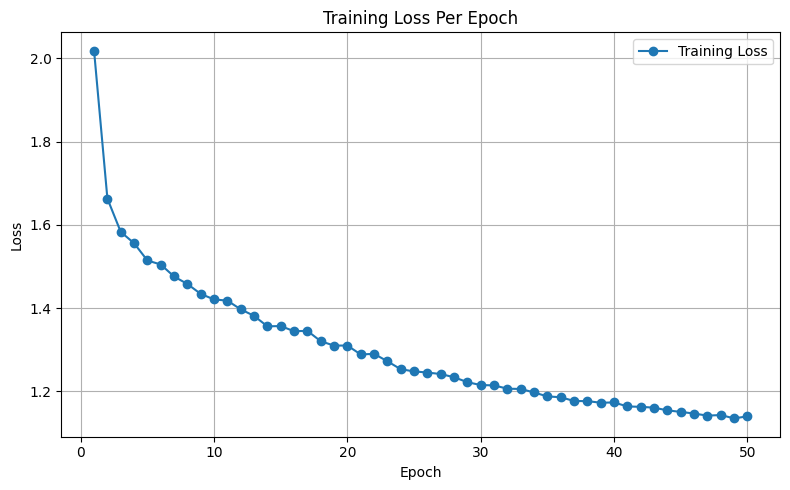

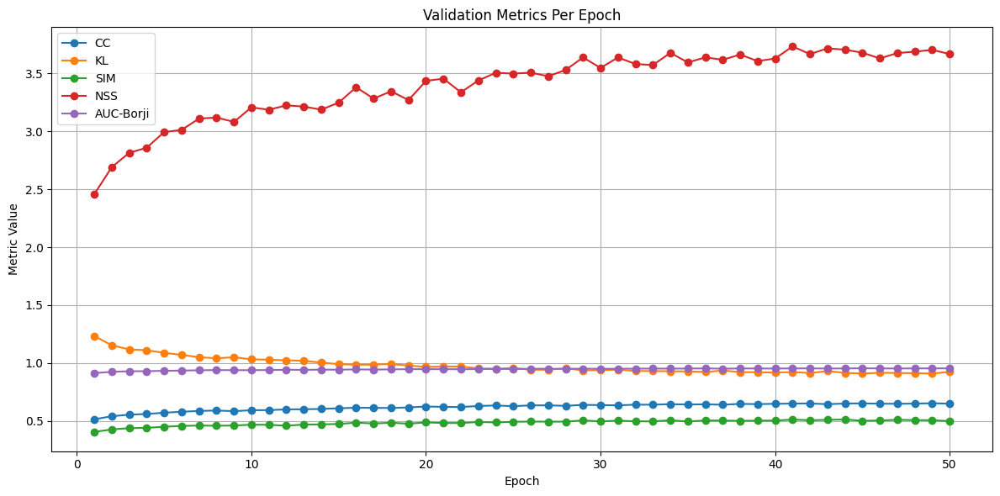

In [ ]:
epochs = range(1, num_epochs + 1)

# 🔹 1. Plot Training Loss
plt.figure(figsize=(8, 5))
plt.plot(epochs, epoch_losses, marker='o', label="Training Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Loss Per Epoch")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# 🔹 2. Plot Validation Metrics
plt.figure(figsize=(12, 6))
for metric in val_metrics_per_epoch:
    plt.plot(epochs, val_metrics_per_epoch[metric], marker='o', label=metric)

plt.xlabel("Epoch")
plt.ylabel("Metric Value")
plt.title("Validation Metrics Per Epoch")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### Regular Training

In [ ]:
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for batch_idx, batch_data in enumerate(train_loader):
        images = batch_data["stimuli"].to(device)   # [B, 3, H, W]
        fdm = batch_data["fdm"].to(device)           # [B, 1, H, W]
        # Task descriptions are returned as a list of strings
        task_descs = batch_data["task_description"]

        optimizer.zero_grad()
        pred_saliency = model(images, task_descs)    # Forward pass using task descriptions
        pred_small = F.interpolate(
            pred_saliency,
            size=fdm.shape[-2:],          # (48, 48)
            mode='bilinear',
            align_corners=False
        )
        loss = criterion(pred_small, fdm)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        if (batch_idx + 1) % 30 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(train_loader)}] Loss: {loss.item():.4f}", flush=True)
    epoch_loss = running_loss / len(train_loader)
    print(f"Epoch [{epoch+1}/{num_epochs}] Average Loss: {epoch_loss:.4f}", flush=True)


Epoch [1/10], Batch [30/173] Loss: 2.4930
Epoch [1/10], Batch [60/173] Loss: 2.2115
Epoch [1/10], Batch [90/173] Loss: 2.2630
Epoch [1/10], Batch [120/173] Loss: 1.8057
Epoch [1/10], Batch [150/173] Loss: 1.5473
Epoch [1/10] Average Loss: 2.2526
Epoch [2/10], Batch [30/173] Loss: 1.4717
Epoch [2/10], Batch [60/173] Loss: 1.7233
Epoch [2/10], Batch [90/173] Loss: 1.8422
Epoch [2/10], Batch [120/173] Loss: 1.6973
Epoch [2/10], Batch [150/173] Loss: 1.6525
Epoch [2/10] Average Loss: 1.7021
Epoch [3/10], Batch [30/173] Loss: 1.6211
Epoch [3/10], Batch [60/173] Loss: 1.5138
Epoch [3/10], Batch [90/173] Loss: 1.6462
Epoch [3/10], Batch [120/173] Loss: 1.5330
Epoch [3/10], Batch [150/173] Loss: 1.4598
Epoch [3/10] Average Loss: 1.6005
Epoch [4/10], Batch [30/173] Loss: 1.5602
Epoch [4/10], Batch [60/173] Loss: 1.7659
Epoch [4/10], Batch [90/173] Loss: 1.5155
Epoch [4/10], Batch [120/173] Loss: 1.5142
Epoch [4/10], Batch [150/173] Loss: 1.3656
Epoch [4/10] Average Loss: 1.5587
Epoch [5/10], Ba

In [ ]:
# Full Dataset (Test Set) Evaluation Cell

import torch
import torch.nn.functional as F

# Make sure your model is in evaluation mode
model.eval()

# Lists to accumulate predictions and ground truths
all_preds = []
all_gts   = []

# Iterate through the test_loader and move predictions and ground truths to CPU
with torch.no_grad():
    for batch_data in test_loader:
        images    = batch_data["stimuli"].to(device)          # [B, 3, H, W]
        gts       = batch_data["fdm"].to(device)              # [B, 1, H, W]
        task_desc = batch_data["task_description"]            # list of strings

        # Forward pass through the model
        preds = model(images, task_desc)                      # [B, 1, h’, w’]

        # Resize predictions to match ground‐truth resolution
        preds = F.interpolate(
            preds,
            size=gts.shape[-2:],                              # (H, W)
            mode='bilinear',
            align_corners=False
        )

        # Move to CPU and store
        all_preds.append(preds.cpu())
        all_gts.append(gts.cpu())

# Concatenate all batches
full_preds = torch.cat(all_preds, dim=0)  # [N, 1, H, W]
full_gts   = torch.cat(all_gts,   dim=0)  # [N, 1, H, W]

# Compute loss over the entire test set
full_loss = criterion(full_preds.to(device), full_gts.to(device))
print(f"Test Set Loss: {full_loss.item():.4f}")

Full Dataset Loss: 1.7164


### Ablation Study

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from ultralytics import YOLO
from einops import rearrange
from sentence_transformers import SentenceTransformer

In [ ]:
class YOLOBackbone(nn.Module):
    def __init__(self, cut_layer=10):
        super().__init__()

        # Load YOLO weights ONCE
        yolo = YOLO("yolov5s.pt")

        # 🔴 Extract PURE PyTorch backbone (no trainer, no hooks)
        self.backbone = yolo.model.model[:cut_layer]

        # Freeze or unfreeze here if you want
        for p in self.backbone.parameters():
            p.requires_grad = True

    def forward(self, x):
        # clone() avoids inference-mode tensor issues
        return self.backbone(x).clone()

In [ ]:
class FPM(nn.Module):
    def __init__(self, in_ch=512, out_ch=128):
        super().__init__()
        self.conv = nn.Conv2d(in_ch, out_ch, 1)

    def forward(self, x):
        return self.conv(x)

In [ ]:
class TaskEncoderSBERT(nn.Module):
    def __init__(self, out_dim=64):
        super().__init__()
        self.encoder = SentenceTransformer("all-MiniLM-L6-v2")
        self.fc = nn.Linear(384, out_dim)

        # (optional) ensure SBERT itself is frozen
        for p in self.encoder.parameters():
            p.requires_grad = False

    def forward(self, texts, device):
        emb = self.encoder.encode(texts, convert_to_tensor=True)  # may be inference-mode tensor
        emb = emb.to(device)

        # 🔴 CRITICAL FIX: convert to a normal tensor safe for training graph
        emb = emb.detach().clone()

        return F.relu(self.fc(emb))

In [ ]:
class TaskEncoderID(nn.Module):
    def __init__(self, num_tasks=4, out_dim=64):
        super().__init__()
        self.emb = nn.Embedding(num_tasks, out_dim)

    def forward(self, ids, device):
        return self.emb(ids.to(device))

In [ ]:
class TransformerFusion(nn.Module):
    def __init__(self, vis_dim=128, task_dim=64):
        super().__init__()
        self.task_proj = nn.Linear(task_dim, vis_dim)
        layer = nn.TransformerEncoderLayer(d_model=vis_dim, nhead=4)
        self.enc = nn.TransformerEncoder(layer, num_layers=1)

    def forward(self, v, t):
        B, C, H, W = v.shape
        v_seq = rearrange(v, "b c h w -> (h w) b c")
        t = rearrange(self.task_proj(t), "b c -> 1 b c")
        x = self.enc(torch.cat([t, v_seq], 0))[1:]
        return rearrange(x, "(h w) b c -> b c h w", h=H, w=W)

In [ ]:
class FiLMFusion(nn.Module):
    def __init__(self, vis_dim=128, task_dim=64):
        super().__init__()
        self.fc = nn.Linear(task_dim, 2 * vis_dim)

    def forward(self, v, t):
        B, C, _, _ = v.shape
        g, b = self.fc(t).chunk(2, dim=1)
        return g.view(B, C, 1, 1) * v + b.view(B, C, 1, 1)

In [ ]:
class Decoder(nn.Module):
    def __init__(self, ch):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(ch, 64, 3, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 4, 2, 1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 1, 4, 2, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x)

In [ ]:
class TDYSN(nn.Module):
    def __init__(self, use_task=True, use_transformer=True, use_sbert=True, use_fpm=True, num_tasks=4):
        super().__init__()
        self.use_task = use_task
        self.use_sbert = use_sbert

        self.backbone = YOLOBackbone()
        self.fpm = FPM() if use_fpm else nn.Identity()
        self.vis_dim = 128 if use_fpm else 512

        self.task_enc = TaskEncoderSBERT() if use_sbert else TaskEncoderID(num_tasks)

        self.fusion = (
            TransformerFusion(self.vis_dim)
            if use_transformer else
            FiLMFusion(self.vis_dim)
        )

        self.decoder = Decoder(self.vis_dim)

    def forward(self, imgs, task_desc=None, task_ids=None):
        v = self.fpm(self.backbone(imgs))

        if self.use_task:
            t = self.task_enc(task_desc, imgs.device) if self.use_sbert else self.task_enc(task_ids, imgs.device)
        else:
            t = torch.zeros(imgs.size(0), 64, device=imgs.device)

        return self.decoder(self.fusion(v, t))

In [ ]:
def train_and_save(cfg, save_path, epochs=50, lr=1e-4):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = TDYSN(num_tasks=num_tasks, **cfg).to(device)
    opt = torch.optim.Adam(model.parameters(), lr=lr)

    for e in range(epochs):
        model.train()
        total = 0.0

        for b in train_loader:
            imgs  = b["stimuli"].to(device)
            gt    = b["fdm"].to(device)
            tasks = b["task_description"]  # list[str]

            # ✅ if SBERT is off, convert strings -> ids
            task_ids = None
            if cfg.get("use_sbert", True) is False:
                task_ids = torch.tensor([task_map[t] for t in tasks], dtype=torch.long)

            opt.zero_grad()
            pred = model(imgs, task_desc=tasks, task_ids=task_ids)
            pred = F.interpolate(pred, gt.shape[-2:], mode="bilinear", align_corners=False)
            loss = criterion(pred, gt)
            loss.backward()
            opt.step()

            total += loss.item()

        print(f"Epoch {e+1}/{epochs} | loss={total/len(train_loader):.4f}")

    torch.save(model.state_dict(), save_path)
    print("Saved:", save_path)

In [ ]:
base = "/content/drive/MyDrive/TDYSN/models"

train_and_save(dict(use_task=True, use_transformer=True, use_sbert=True, use_fpm=True),
               f"{base}/full.pth")

train_and_save(dict(use_task=False, use_transformer=True, use_sbert=True, use_fpm=True),
               f"{base}/no_task.pth")

train_and_save(dict(use_task=True, use_transformer=False, use_sbert=True, use_fpm=True),
               f"{base}/no_transformer.pth")

train_and_save(dict(use_task=True, use_transformer=True, use_sbert=False, use_fpm=True),
               f"{base}/no_sbert.pth")

train_and_save(dict(use_task=True, use_transformer=True, use_sbert=True, use_fpm=False),
               f"{base}/no_fpm.pth")

PRO TIP 💡 Replace 'model=yolov5s.pt' with new 'model=yolov5su.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.

Epoch 1/50 | loss=1.9589
Epoch 2/50 | loss=1.3574
Epoch 3/50 | loss=1.2533
Epoch 4/50 | loss=1.2016
Epoch 5/50 | loss=1.1686
Epoch 6/50 | loss=1.1407
Epoch 7/50 | loss=1.1167
Epoch 8/50 | loss=1.1056
Epoch 9/50 | loss=1.0950
Epoch 10/50 | loss=1.0688
Epoch 11/50 | loss=1.0414
Epoch 12/50 | loss=1.0027
Epoch 13/50 | loss=0.9870
Epoch 14/50 | loss=0.9795
Epoch 15/50 | loss=0.9517
Epoch 16/50 | loss=0.9494
Epoch 17/50 | loss=0.9331
Epoch 18/50 | loss=0.9149
Epoch 19/50 | loss=0.9047
Epoch 20/50 | loss=0.8970
Epoch 21/50 | loss=0.8820
Epoch 22/50 | loss=0.8765
Epoch 23/50 | loss=0.8725
Epoch 24/50 | loss=0.8608
Epoch 25/50 | loss=0.8551
Epoch 26/50 | loss=0.8444
Epoch 27/50 | loss=0.8342
Epoch 28/50 | loss=0.8436
Epoch 29/50 | loss=0.817

AttributeError: 'NoneType' object has no attribute 'to'

In [ ]:
def build_task_map_from_loader(loader, key="task_description", max_batches=200):
    tasks = set()
    for i, b in enumerate(loader):
        for t in b[key]:
            tasks.add(t)
        if i + 1 >= max_batches:
            break
    tasks = sorted(list(tasks))
    return {t: i for i, t in enumerate(tasks)}

task_map = build_task_map_from_loader(train_loader)
num_tasks = len(task_map)
print("num_tasks:", num_tasks)
print(task_map)

num_tasks: 4
{'count people': 0, 'detect the emotion': 1, 'free view': 2, 'identify the action': 3}


In [ ]:
base = "/content/drive/MyDrive/TDYSN/models"

train_and_save(dict(use_task=True, use_transformer=True, use_sbert=False, use_fpm=True),
               f"{base}/no_sbert.pth")

train_and_save(dict(use_task=True, use_transformer=True, use_sbert=True, use_fpm=False),
               f"{base}/no_fpm.pth")

PRO TIP 💡 Replace 'model=yolov5s.pt' with new 'model=yolov5su.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.

Epoch 1/50 | loss=1.9519
Epoch 2/50 | loss=1.3374
Epoch 3/50 | loss=1.2296
Epoch 4/50 | loss=1.1598
Epoch 5/50 | loss=1.1003
Epoch 6/50 | loss=1.0654
Epoch 7/50 | loss=1.0304
Epoch 8/50 | loss=0.9977
Epoch 9/50 | loss=0.9713
Epoch 10/50 | loss=0.9632
Epoch 11/50 | loss=0.9402
Epoch 12/50 | loss=0.9466
Epoch 13/50 | loss=0.9195
Epoch 14/50 | loss=0.9033
Epoch 15/50 | loss=0.8873
Epoch 16/50 | loss=0.8676
Epoch 17/50 | loss=0.8582
Epoch 18/50 | loss=0.8413
Epoch 19/50 | loss=0.8299
Epoch 20/50 | loss=0.8233
Epoch 21/50 | loss=0.8096
Epoch 22/50 | loss=0.8060
Epoch 23/50 | loss=0.7952
Epoch 24/50 | loss=0.7871
Epoch 25/50 | loss=0.7786
Epoch 26/50 | loss=0.7692
Epoch 27/50 | loss=0.7749
Epoch 28/50 | loss=0.7510
Epoch 29/50 | loss=0.743

In [ ]:
import torch
import numpy as np

EPS = 1e-8

def _normalize_map(x):
    x = x - x.min()
    x = x / (x.max() + EPS)
    return x

def cc_metric(pred, gt):
    # Pearson correlation (per-sample, then mean)
    B = pred.shape[0]
    pred = pred.view(B, -1)
    gt = gt.view(B, -1)
    pred = pred - pred.mean(dim=1, keepdim=True)
    gt = gt - gt.mean(dim=1, keepdim=True)
    num = (pred * gt).sum(dim=1)
    den = torch.sqrt((pred**2).sum(dim=1) * (gt**2).sum(dim=1) + EPS)
    return (num / (den + EPS)).mean().item()

def kl_metric(pred, gt):
    # KL(gt || pred) with both normalized to sum to 1
    B = pred.shape[0]
    pred = pred.view(B, -1)
    gt = gt.view(B, -1)

    pred = pred.clamp(min=EPS)
    gt = gt.clamp(min=EPS)

    pred = pred / (pred.sum(dim=1, keepdim=True) + EPS)
    gt = gt / (gt.sum(dim=1, keepdim=True) + EPS)

    kl = (gt * (gt.log() - pred.log())).sum(dim=1)
    return kl.mean().item()

def sim_metric(pred, gt):
    # Histogram intersection after sum-normalization
    B = pred.shape[0]
    pred = pred.view(B, -1).clamp(min=0)
    gt = gt.view(B, -1).clamp(min=0)

    pred = pred / (pred.sum(dim=1, keepdim=True) + EPS)
    gt = gt / (gt.sum(dim=1, keepdim=True) + EPS)

    sim = torch.min(pred, gt).sum(dim=1)
    return sim.mean().item()

def nss_metric(pred, fix):
    # fix should be binary fixation map [B,1,H,W] (0/1)
    B = pred.shape[0]
    s = pred.view(B, -1)
    f = fix.view(B, -1)

    s = (s - s.mean(dim=1, keepdim=True)) / (s.std(dim=1, keepdim=True) + EPS)

    # average saliency at fixation locations
    n_fix = f.sum(dim=1).clamp(min=1)
    nss = (s * f).sum(dim=1) / n_fix
    return nss.mean().item()

def auc_borji_metric(pred, fix, n_splits=100, step=0.1):
    # Slow but standard-ish Borji AUC: random negatives
    # pred: [B,1,H,W], fix: [B,1,H,W] binary
    pred = pred.detach().cpu().numpy()
    fix = fix.detach().cpu().numpy()

    B = pred.shape[0]
    aucs = []

    for b in range(B):
        s_map = pred[b, 0]
        f_map = fix[b, 0].astype(bool)

        if f_map.sum() == 0:
            continue

        S = (s_map - s_map.min()) / (s_map.max() - s_map.min() + 1e-8)
        S_fix = S[f_map]  # positives

        # sample random negatives
        neg_idx = np.where(~f_map.flatten())[0]
        if len(neg_idx) == 0:
            continue

        for _ in range(n_splits):
            rand_neg = np.random.choice(neg_idx, size=S_fix.size, replace=False if len(neg_idx) >= S_fix.size else True)
            S_rand = S.flatten()[rand_neg]

            # compute ROC
            thresholds = np.arange(0, 1 + step, step)
            tp = np.array([(S_fix >= t).mean() for t in thresholds])
            fp = np.array([(S_rand >= t).mean() for t in thresholds])

            # trapezoid integral
            auc = np.trapz(tp, fp)
            aucs.append(auc)

    if len(aucs) == 0:
        return float("nan")
    return float(np.mean(aucs))

def compute_metrics(pred, gt):
    # pred, gt: [B,1,H,W] float
    # Fixation map for NSS/AUC: thresholded gt (same assumption you used before)
    fix = (gt > 0.5).float()
    return (
        cc_metric(pred, gt),
        kl_metric(pred, gt),
        sim_metric(pred, gt),
        nss_metric(pred, fix),
        auc_borji_metric(pred, fix),
    )

In [ ]:
import torch.nn.functional as F
import pandas as pd

def build_task_map_from_loader(loader, key="task_description", max_batches=500):
    tasks = set()
    for i, b in enumerate(loader):
        for t in b[key]:
            tasks.add(t)
        if i + 1 >= max_batches:
            break
    tasks = sorted(list(tasks))
    return {t: i for i, t in enumerate(tasks)}

task_map = build_task_map_from_loader(test_loader)  # or train_loader, both ok
num_tasks = len(task_map)

def evaluate_model(model, loader, device):
    model.eval()
    scores = {k: [] for k in ["CC","KL","SIM","NSS","AUC-Borji"]}

    with torch.no_grad():
        for b in loader:
            imgs  = b["stimuli"].to(device)
            gt    = b["fdm"].to(device)
            tasks = b["task_description"]

            task_ids = None
            if getattr(model, "use_sbert", True) is False:
                task_ids = torch.tensor([task_map[t] for t in tasks], dtype=torch.long)

            pred = model(imgs, task_desc=tasks, task_ids=task_ids)
            pred = F.interpolate(pred, gt.shape[-2:], mode="bilinear", align_corners=False)

            cc, kl, sim, nss, auc = compute_metrics(pred, gt)

            scores["CC"].append(cc)
            scores["KL"].append(kl)
            scores["SIM"].append(sim)
            scores["NSS"].append(nss)
            scores["AUC-Borji"].append(auc)

    return {k: float(torch.tensor(v).mean()) for k,v in scores.items()}

In [ ]:
import os

base = "/content/drive/MyDrive/TDYSN/models"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

runs = [
    ("Full TDYSN",       dict(use_task=True,  use_transformer=True,  use_sbert=True,  use_fpm=True),  "full.pth"),
    ("w/o Task",         dict(use_task=False, use_transformer=True,  use_sbert=True,  use_fpm=True),  "no_task.pth"),
    ("w/o Transformer",  dict(use_task=True,  use_transformer=False, use_sbert=True,  use_fpm=True),  "no_transformer.pth"),
    ("w/o SBERT",        dict(use_task=True,  use_transformer=True,  use_sbert=False, use_fpm=True),  "no_sbert.pth"),
    ("w/o FPM",          dict(use_task=True,  use_transformer=True,  use_sbert=True,  use_fpm=False), "no_fpm.pth"),
]

rows = []
for display_name, cfg, fname in runs:
    path = f"{base}/{fname}"
    if not os.path.exists(path):
        raise FileNotFoundError(f"Missing model file: {path}")

    model = TDYSN(num_tasks=num_tasks, **cfg).to(device)
    state = torch.load(path, map_location=device)
    model.load_state_dict(state, strict=False)

    res = evaluate_model(model, test_loader, device)
    res["Model"] = display_name
    rows.append(res)
    print("Done:", display_name, res)

df = pd.DataFrame(rows)[["Model","CC","KL","SIM","NSS","AUC-Borji"]].round(4)
print(df)

latex = df.to_latex(
    index=False,
    caption="Ablation study on TDYSN.",
    label="tab:ablation",
    column_format="lccccc"
)
print(latex)

PRO TIP 💡 Replace 'model=yolov5s.pt' with new 'model=yolov5su.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



/tmp/ipython-input-2247947512.py:96: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  auc = np.trapz(tp, fp)


Done: Full TDYSN {'CC': 0.680614709854126, 'KL': 0.8641195297241211, 'SIM': 0.5388287305831909, 'NSS': 3.84489369392395, 'AUC-Borji': -0.9264057278633118, 'Model': 'Full TDYSN'}
PRO TIP 💡 Replace 'model=yolov5s.pt' with new 'model=yolov5su.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.

Done: w/o Task {'CC': 0.6533020734786987, 'KL': 0.9563215970993042, 'SIM': 0.5275493264198303, 'NSS': 3.6965088844299316, 'AUC-Borji': -0.9005473256111145, 'Model': 'w/o Task'}
PRO TIP 💡 Replace 'model=yolov5s.pt' with new 'model=yolov5su.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.

Done: w/o Transformer {'CC': 0.6893704533576965, 'KL': 0.8700112104415894, 'SIM': 0.5556076169013977, 'NSS': 3.9790241718292236, 'A

### Save the model

In [ ]:
import os

# Path to your models folder inside TDSP
models_dir = "/content/drive/MyDrive/TDSP/models"
# Create the folder if it doesn't exist
os.makedirs(models_dir, exist_ok=True)

# Full path where you want to save your model
save_path = os.path.join(models_dir, "tdsp_50epoch.pth")

# Save the model state dictionary
torch.save(model.state_dict(), save_path)
print(f"Model saved to {save_path}")

Model saved to /content/drive/MyDrive/TDSP/models/tdsp_50epoch.pth


## Inference


### Inference of the most recent model on the test dataset.

In [ ]:
import random, os
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

def visualize_random_test_sample(model_path: str):
    """
    Loads YOLOTaskSaliencyModel from model_path, picks a random image from test_ds,
    runs it through the model for all 4 tasks, and plots predictions vs GT.
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    # 1) Load model
    model = YOLOTaskSaliencyModel().to(device)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()

    # 2) Pick a random test‐split sample and get its base filename
    rand_subset_idx = random.randint(0, len(test_ds) - 1)
    orig_idx        = test_ds.indices[rand_subset_idx]
    _, fdm_path, _  = dataset.samples[orig_idx]
    base_name       = os.path.splitext(os.path.basename(fdm_path))[0]

    # 3) Find all four views of that image in the full dataset
    matched_idxs = [
        i
        for i, (_, fdm_p, _) in enumerate(dataset.samples)
        if os.path.splitext(os.path.basename(fdm_p))[0] == base_name
    ]
    assert len(matched_idxs) == 4, f"Expected 4 views for {base_name}, got {len(matched_idxs)}"

    # 4) Build a mini‐batch
    samples      = [dataset[i] for i in matched_idxs]
    images_batch = torch.stack([s["stimuli"]          for s in samples], dim=0).to(device)  # [4,3,H,W]
    fdm_batch    = torch.stack([s["fdm"]              for s in samples], dim=0)          # [4,1,H,W]
    descs        = [s["task_description"] for s in samples]                              # 4 strings

    # 5) Inference + resize
    with torch.no_grad():
        preds = model(images_batch, descs)
        preds = F.interpolate(
            preds,
            size=fdm_batch.shape[-2:],
            mode="bilinear",
            align_corners=False
        )

    # 6) To NumPy & plot
    pred_np = preds.cpu().numpy()  # [4,1,H,W]
    gt_np   = fdm_batch.numpy()    # [4,1,H,W]

    fig, axes = plt.subplots(2, 4, figsize=(16, 6))
    for i in range(4):
        axes[0,i].imshow(pred_np[i,0], cmap="gray")
        axes[0,i].set_title(f"Predicted\n{descs[i]}")
        axes[0,i].axis("off")

        axes[1,i].imshow(gt_np[i,0], cmap="gray")
        axes[1,i].set_title("Ground Truth")
        axes[1,i].axis("off")

    fig.suptitle(f"Random test image: {base_name}\nModel: {os.path.basename(model_path)}", y=1.02)
    plt.tight_layout()
    plt.show()

PRO TIP 💡 Replace 'model=yolov5s.pt' with new 'model=yolov5su.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



100%|██████████| 17.7M/17.7M [00:00<00:00, 117MB/s] 
/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/transformer.py:382: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


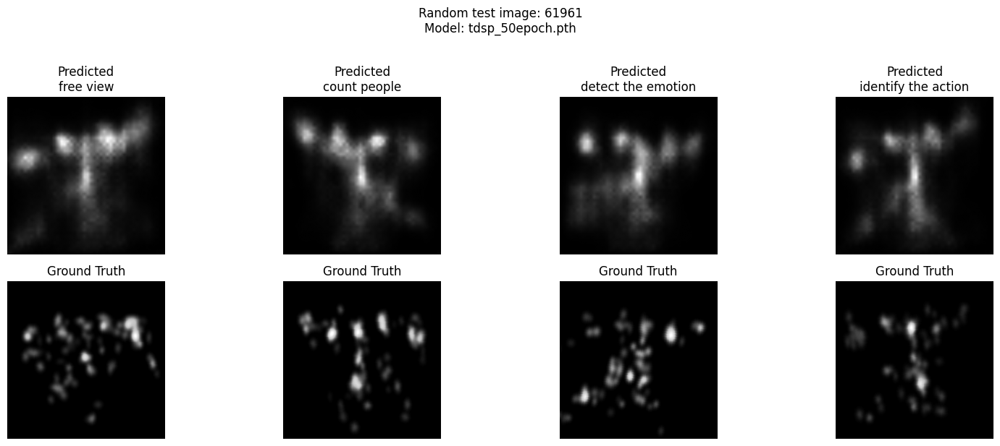

In [ ]:
model_path = "/content/drive/MyDrive/TDSP/models/tdsp_50epoch.pth"
visualize_random_test_sample(model_path)

### Inference of Model Performance on N different images for each task

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
PRO TIP 💡 Replace 'model=yolov5s.pt' with new 'model=yolov5su.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.


--- Generating panel #1 for test_ds index 26 → /content/drive/MyDrive/TDSP/images/panel_1.png ---

--- Generating panel #2 for test_ds index 137 → /content/drive/MyDrive/TDSP/images/panel_2.png ---

--- Generating panel #3 for test_ds index 44 → /content/drive/MyDrive/TDSP/images/panel_3.png ---

--- Generating panel #4 for test_ds index 208 → /content/drive/MyDrive/TDSP/images/panel_4.png ---

--- Fusing the four panels into one 2×2 image for display ---


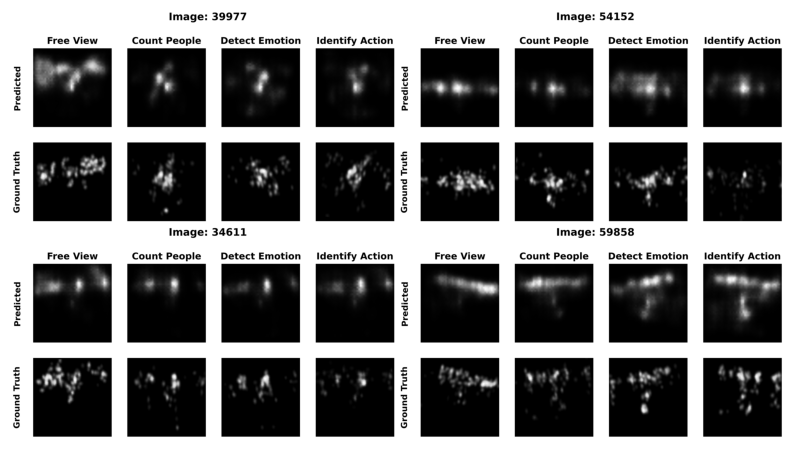

In [ ]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import random
import os
import numpy as np
from PIL import Image, ImageDraw, ImageFont

from google.colab import drive
drive.mount('/content/drive')

base_dir   = "/content/drive/MyDrive/TDSP/images"
model_path = "/content/drive/MyDrive/TDSP/models/tdsp_50epoch.pth"
os.makedirs(base_dir, exist_ok=True)

# -------------------------------------------------------------------------
# Individual 2x4 Panel Generator with “Predicted” & “Ground Truth” labels
# -------------------------------------------------------------------------
def save_2x4_panel_short_titles(model, dataset, test_ds, subset_idx, out_filepath, figsize=(14, 7)):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    global_idx = test_ds.indices[subset_idx]
    _, fdm_path, _ = dataset.samples[global_idx]
    base_name = os.path.splitext(os.path.basename(fdm_path))[0]

    matched = [
        idx for idx, (_, fdm_p, _) in enumerate(dataset.samples)
        if os.path.splitext(os.path.basename(fdm_p))[0] == base_name
    ]
    if len(matched) != 4:
        raise RuntimeError(f"Expected 4 task‐views for '{base_name}', but found {len(matched)}")

    desc_to_idx = {dataset[i]["task_description"]: i for i in matched}
    full_to_short = {
        "free view":            "Free View",
        "count people":         "Count People",
        "detect the emotion":   "Detect Emotion",
        "identify the action":  "Identify Action"
    }
    task_order_full  = ["free view", "count people", "detect the emotion", "identify the action"]
    task_order_short = [full_to_short[f] for f in task_order_full]
    ordered_indices = [desc_to_idx[f] for f in task_order_full]
    ordered_samples = [dataset[i] for i in ordered_indices]

    imgs_tensor = torch.stack([s["stimuli"] for s in ordered_samples], dim=0).to(device)
    gt_tensor   = torch.stack([s["fdm"]     for s in ordered_samples], dim=0)

    with torch.no_grad():
        preds = model(imgs_tensor, task_order_full)
        preds = F.interpolate(preds, size=gt_tensor.shape[-2:], mode="bilinear", align_corners=False)
    pred_np = preds.cpu().numpy()
    gt_np   = gt_tensor.numpy()

    fig, axes = plt.subplots(2, 4, figsize=figsize, gridspec_kw={"wspace": 0.2, "hspace": 0.10})
    label_fontsize = 18

    for col_i in range(4):
        ax_pred = axes[0, col_i]
        ax_pred.imshow(pred_np[col_i, 0], cmap="gray")
        ax_pred.axis("off")
        ax_pred.set_title(task_order_short[col_i], fontsize=20, fontweight="bold", pad=10)

        if col_i == 0:
            ax_pred.text(-0.15, 0.5, "Predicted", fontsize=label_fontsize,
                         fontweight="bold", va="center", ha="right", transform=ax_pred.transAxes, rotation=90)

        ax_gt = axes[1, col_i]
        ax_gt.imshow(gt_np[col_i, 0], cmap="gray")
        ax_gt.axis("off")

        if col_i == 0:
            ax_gt.text(-0.15, 0.5, "Ground Truth", fontsize=label_fontsize,
                       fontweight="bold", va="center", ha="right", transform=ax_gt.transAxes, rotation=90)

    fig.suptitle(f"Image: {base_name}", fontsize=22, fontweight="bold", y=1.02)
    os.makedirs(os.path.dirname(out_filepath), exist_ok=True)
    fig.savefig(out_filepath, dpi=300, bbox_inches="tight")
    plt.close(fig)

# -------------------------------------------------------------------------
# Combine 4 Panels into 2x2 Layout (No Re-labeling Needed Anymore)
# -------------------------------------------------------------------------
def fuse_panels_2x2_with_labels(panel_paths, out_path="all_in_one_2x2.png"):
    imgs = [Image.open(p) for p in panel_paths]
    W, H = imgs[0].size
    for idx, im in enumerate(imgs):
        if im.size != (W, H):
            raise ValueError(f"Panel '{panel_paths[idx]}' is size {im.size}, expected ({W},{H}).")

    new_w, new_h = 2 * W, 2 * H
    combined = Image.new("RGB", (new_w, new_h), (255, 255, 255))

    combined.paste(imgs[0], (0,   0))
    combined.paste(imgs[1], (W,   0))
    combined.paste(imgs[2], (0,   H))
    combined.paste(imgs[3], (W,   H))

    # OPTIONAL: Save to disk — remove/comment this if you don’t want to save
    combined.save(out_path, dpi=(300, 300))

    # Display output in notebook
    plt.figure(figsize=(10, 10))
    plt.imshow(np.asarray(combined))
    plt.axis("off")
    plt.show()

# -------------------------------------------------------------------------
# Run the Full Pipeline: Generate Panels & Fuse for Display
# -------------------------------------------------------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = YOLOTaskSaliencyModel().to(device)
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()

random.seed(123)
chosen_idxs = random.sample(range(len(test_ds)), 4)

panel_files = []
for i, subset_idx in enumerate(chosen_idxs, start=1):
    panel_fname = os.path.join(base_dir, f"panel_{i}.png")
    print(f"\n--- Generating panel #{i} for test_ds index {subset_idx} → {panel_fname} ---")
    save_2x4_panel_short_titles(
        model=model,
        dataset=dataset,
        test_ds=test_ds,
        subset_idx=subset_idx,
        out_filepath=panel_fname,
        figsize=(14, 7)
    )
    panel_files.append(panel_fname)

print("\n--- Fusing the four panels into one 2×2 image for display ---")
fuse_panels_2x2_with_labels(panel_files, out_path=os.path.join(base_dir, "all_in_one_2x2.png"))

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
PRO TIP 💡 Replace 'model=yolov5s.pt' with new 'model=yolov5su.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



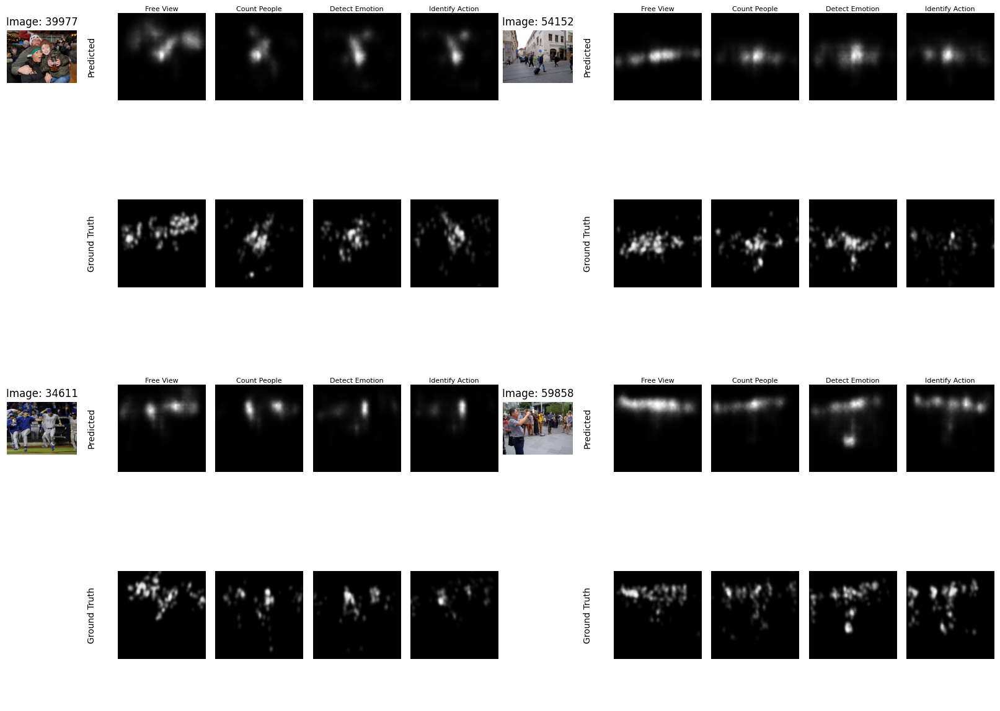

In [ ]:
# Single Colab cell: 2×2 grid with stimulus left of each panel’s Pred/GT maps

import os
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from google.colab import drive

# 1) Mount Google Drive
drive.mount('/content/drive')

# 2) Load model
model_path = "/content/drive/MyDrive/TDSP/models/tdsp_40epoch.pth"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = YOLOTaskSaliencyModel().to(device)
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()

# 3) IDs and task info
image_ids  = [39977, 54152, 34611, 59858]
task_order = ["free view", "count people", "detect the emotion", "identify the action"]
task_names = ["Free View", "Count People", "Detect Emotion", "Identify Action"]

# 4) Build combined figure
fig = plt.figure(figsize=(16, 12), constrained_layout=True)
outer = fig.add_gridspec(2, 2, wspace=0.1, hspace=0.1)

for idx, img_id in enumerate(image_ids):
    r, c = divmod(idx, 2)
    cell = outer[r, c]
    # subgrid: 2 rows × 5 cols; col0 for stimulus, cols1–4 for preds/GTs
    inner = cell.subgridspec(
        2, 5,
        width_ratios=[0.8, 1, 1, 1, 1],
        wspace=0.05, hspace=0.02
    )

    # — Gather data for this image_id —
    base = str(img_id)
    matched = [
        i for i, (p, _, _) in enumerate(dataset.samples)
        if os.path.splitext(os.path.basename(p))[0] == base
    ]
    assert len(matched) == 4, f"{base}: expected 4 tasks, got {len(matched)}"

    # Load stimulus
    stim_path = dataset.samples[matched[0]][0]
    stim_np   = np.array(Image.open(stim_path).convert("RGB"))

    # Load GT maps and input tensors
    gt_batch = torch.stack([dataset[i]["fdm"] for i in matched], dim=0)        # [4,1,H,W]
    imgs_t   = torch.stack([dataset[i]["stimuli"] for i in matched], dim=0).to(device)  # [4,3,H,W]

    # Model prediction + upsample to GT size
    with torch.no_grad():
        preds = model(imgs_t, task_order)                                       # [4,1,h',w']
        preds = F.interpolate(
            preds,
            size=gt_batch.shape[-2:],
            mode="bilinear",
            align_corners=False
        )
    pred_np = preds.cpu().squeeze(1).numpy()   # [4,H,W]
    gt_np   = gt_batch.squeeze(1).numpy()      # [4,H,W]

    # — Plot stimulus in top-left cell only —
    ax_stim = fig.add_subplot(inner[0, 0])
    ax_stim.imshow(stim_np)
    ax_stim.set_title(f"Image: {base}", pad=6, fontsize=12)
    ax_stim.axis("off")

    # leave bottom-left blank
    ax_blank = fig.add_subplot(inner[1, 0])
    ax_blank.axis("off")

    # — Plot Predicted maps (row 0, cols 1–4) —
    pred_axes = []
    for i in range(4):
        axp = fig.add_subplot(inner[0, i+1])
        axp.imshow(pred_np[i], cmap="gray", vmin=0, vmax=pred_np[i].max())
        axp.set_title(task_names[i], fontsize=8, pad=2)
        axp.axis("off")
        pred_axes.append(axp)
    # add vertical "Predicted" label next to first pred map
    pred_axes[0].text(
        -0.3, 0.5, "Predicted",
        va="center", ha="center", rotation="vertical",
        transform=pred_axes[0].transAxes, fontsize=10
    )

    # — Plot Ground Truth maps (row 1, cols 1–4) —
    gt_axes = []
    for i in range(4):
        axg = fig.add_subplot(inner[1, i+1])
        axg.imshow(gt_np[i], cmap="gray", vmin=0, vmax=gt_np[i].max())
        axg.axis("off")
        gt_axes.append(axg)
    # add vertical "Ground Truth" label
    gt_axes[0].text(
        -0.3, 0.5, "Ground Truth",
        va="center", ha="center", rotation="vertical",
        transform=gt_axes[0].transAxes, fontsize=10
    )

# 5) Show
plt.show()


### Inference with RGB images

PRO TIP 💡 Replace 'model=yolov5s.pt' with new 'model=yolov5su.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



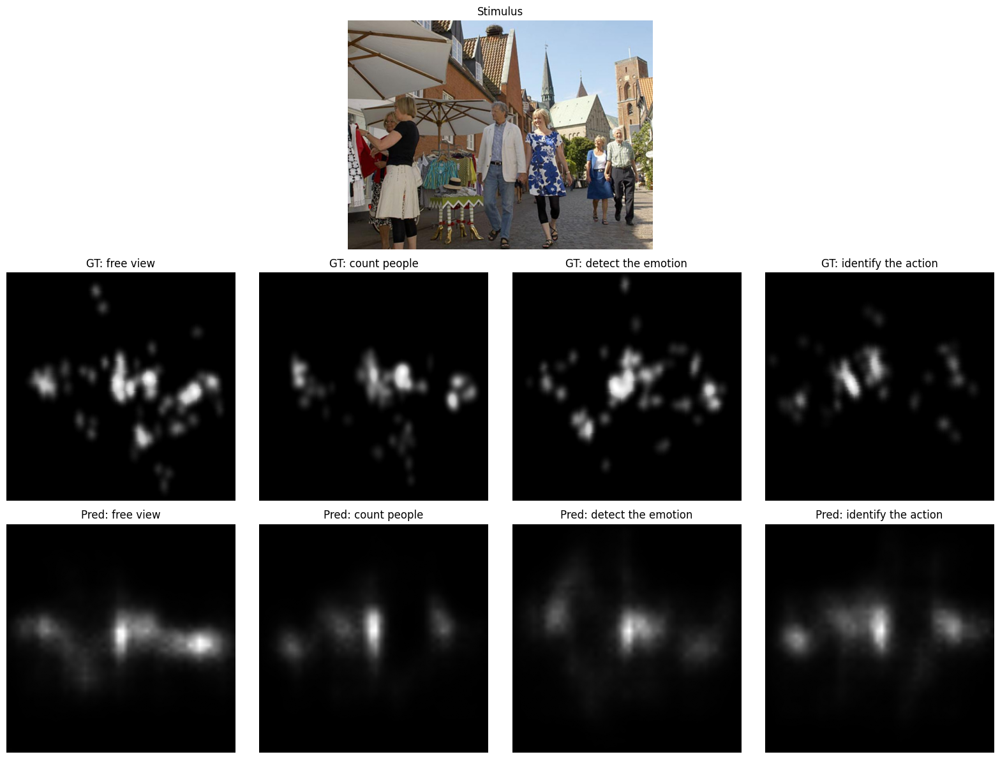

In [ ]:
def visualize_fdm_maps_gray(model_path: str, dataset, test_ds):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = YOLOTaskSaliencyModel().to(device)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()

    # pick a random test sample
    idx0      = random.randint(0, len(test_ds)-1)
    orig_idx  = test_ds.indices[idx0]
    stim_path, _, _ = dataset.samples[orig_idx]
    base      = os.path.splitext(os.path.basename(stim_path))[0]

    # find its 4 task entries
    matched = [i for i,(s,_,_) in enumerate(dataset.samples)
               if os.path.splitext(os.path.basename(s))[0] == base]

    # load stimulus
    stim = np.array(Image.open(stim_path).convert("RGB"))

    # batch stimuli, GTs, descs
    imgs, gt_maps, descs = [], [], []
    for i in matched:
        imgs.append(dataset[i]["stimuli"])
        gt_maps.append(dataset[i]["fdm"].squeeze(0).numpy())
        descs.append(dataset[i]["task_description"])
    imgs_t = torch.stack(imgs, 0).to(device)

    # predict & upsample
    with torch.no_grad():
        preds = model(imgs_t, descs)
        preds = F.interpolate(preds,
                              size=gt_maps[0].shape,
                              mode="bilinear", align_corners=False)
        pred_maps = preds.cpu().squeeze(1).numpy()

    # plot 3×4 grid with GRAY FDMs
    fig = plt.figure(figsize=(16, 12))
    gs = fig.add_gridspec(3, 4, height_ratios=[1,1,1])

    # Row0: stimulus spans all cols
    ax = fig.add_subplot(gs[0, :])
    ax.imshow(stim)
    ax.set_title("Stimulus")
    ax.axis("off")

    # Row1: GT FDMs in gray
    for i in range(4):
        ax = fig.add_subplot(gs[1, i])
        ax.imshow(gt_maps[i], cmap="gray")
        ax.set_title(f"GT: {descs[i]}")
        ax.axis("off")

    # Row2: Pred FDMs in gray
    for i in range(4):
        ax = fig.add_subplot(gs[2, i])
        ax.imshow(pred_maps[i], cmap="gray")
        ax.set_title(f"Pred: {descs[i]}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# Usage:
ckpt = "/content/drive/MyDrive/TDSP/models/tdsp_40epoch.pth"
visualize_fdm_maps_gray(ckpt, dataset, test_ds)


PRO TIP 💡 Replace 'model=yolov5s.pt' with new 'model=yolov5su.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



<ipython-input-37-98df6ed2658a>:114: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


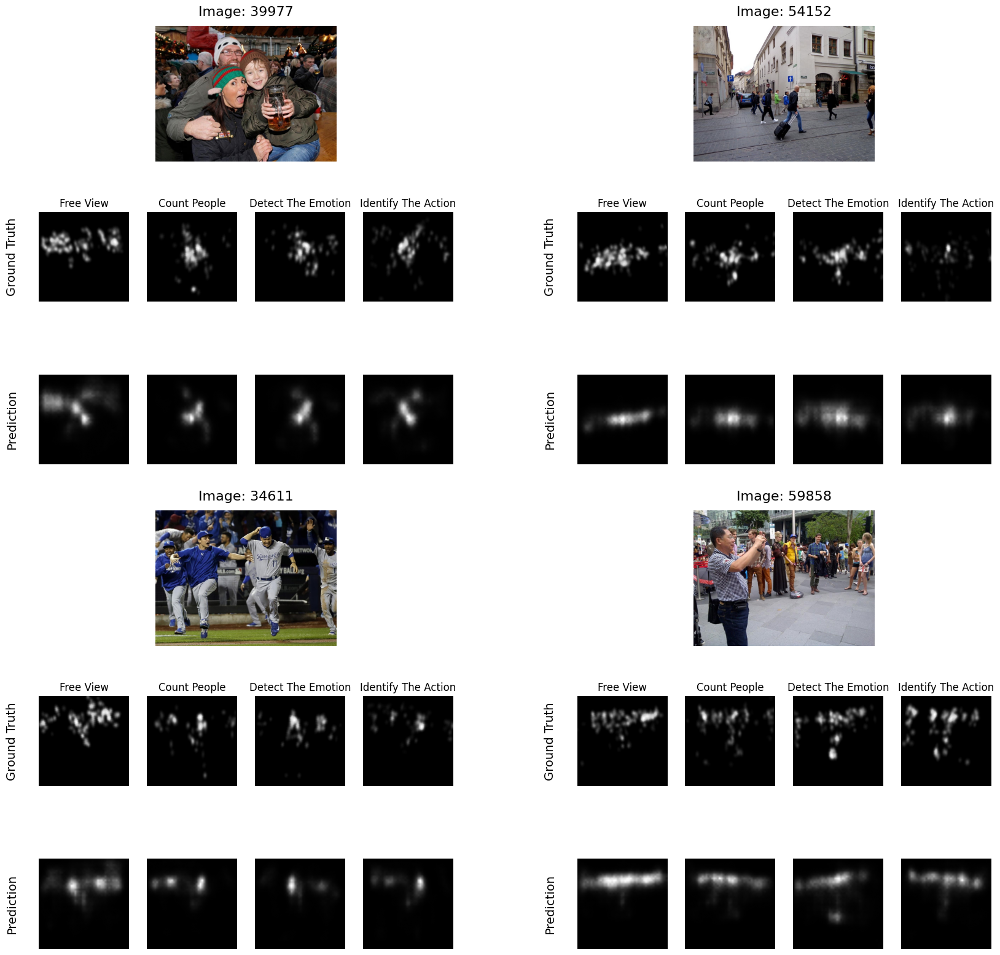

In [ ]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F
from PIL import Image

def visualize_grid_of_fdm_maps(model_path, dataset, test_ds, image_ids):
    """
    image_ids: list of base filenames (e.g. [39977, 54152, 34611, 59858])
    Produces a single 2×2 grid of 3×4 panels (stimulus, GTs, Preds) for each ID,
    with:
      • stimulus printed once (centered) with its ID above it,
      • a vertical "Ground Truth" label on the left of the GT row,
      • a vertical "Prediction" label on the left of the Pred row,
      • task names only on the GT row as column titles.
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Load your 40-epoch model once
    model = YOLOTaskSaliencyModel().to(device)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()

    # Gather data for each image_id
    panels = []
    for base in image_ids:
        base = str(base)
        # 1) find the 4 indices for this base image
        matched = [
            i for i, (p,_,_) in enumerate(dataset.samples)
            if os.path.splitext(os.path.basename(p))[0] == base
        ]
        assert len(matched) == 4, f"{base}: expected 4 tasks, got {len(matched)}"

        # 2) load stimulus once
        stim_path = dataset.samples[matched[0]][0]
        stim_np   = np.array(Image.open(stim_path).convert("RGB"))

        # 3) build batch + GT maps + descriptions
        imgs, gt_maps, descs = [], [], []
        for idx in matched:
            sample = dataset[idx]
            imgs.append(sample["stimuli"])                       # [3,H,W]
            gt_maps.append(sample["fdm"].squeeze(0).numpy())     # [H,W]
            descs.append(sample["task_description"].title())    # e.g. "Free View"
        imgs_t = torch.stack(imgs, dim=0).to(device)            # [4,3,H,W]

        # 4) predict + upsample
        with torch.no_grad():
            preds = model(imgs_t, descs)                         # [4,1,h',w']
            preds = F.interpolate(
                preds,
                size=gt_maps[0].shape,                          # (H,W)
                mode="bilinear",
                align_corners=False
            )
            pred_maps = preds.cpu().squeeze(1).numpy()           # [4,H,W]

        panels.append((base, stim_np, gt_maps, pred_maps, descs))

    # Build one big 2×2 figure
    fig = plt.figure(figsize=(20, 20))
    # reduce vertical gap between the two panel-rows
    outer = fig.add_gridspec(2, 2, wspace=0.3, hspace=0.05)

    for idx, (base, stim_np, gt_maps, pred_maps, descs) in enumerate(panels):
        r, c = divmod(idx, 2)
        inner = outer[r, c].subgridspec(3, 4, height_ratios=[1,1,1])

        # --- Row 0: stimulus once, centered in cols 1–2, with title above ---
        ax0 = fig.add_subplot(inner[0, 1:3])
        ax0.imshow(stim_np)
        ax0.set_title(f"Image: {base}", fontsize=16, pad=12)
        ax0.axis("off")
        # blank out the two corners
        for col in (0, 3):
            ax_corner = fig.add_subplot(inner[0, col])
            ax_corner.axis("off")

        # --- Row 1: GT heatmaps with task titles ---
        gt_axes = []
        for i in range(4):
            ax = fig.add_subplot(inner[1, i])
            ax.imshow(gt_maps[i], cmap="gray")
            ax.set_title(descs[i], fontsize=12)
            ax.axis("off")
            gt_axes.append(ax)
        # vertical row label
        gt_axes[0].text(
            -0.3, 0.5, "Ground Truth",
            va="center", ha="center",
            rotation="vertical",
            transform=gt_axes[0].transAxes,
            fontsize=14
        )

        # --- Row 2: Pred heatmaps (no titles) ---
        pred_axes = []
        for i in range(4):
            ax = fig.add_subplot(inner[2, i])
            ax.imshow(pred_maps[i], cmap="gray")
            ax.axis("off")
            pred_axes.append(ax)
        # vertical row label
        pred_axes[0].text(
            -0.3, 0.5, "Prediction",
            va="center", ha="center",
            rotation="vertical",
            transform=pred_axes[0].transAxes,
            fontsize=14
        )

    plt.tight_layout()
    plt.show()


# ——— Call it once at the end ———
ckpt = "/content/drive/MyDrive/TDSP/models/tdsp_40epoch.pth"
ids  = [39977, 54152, 34611, 59858]
visualize_grid_of_fdm_maps(ckpt, dataset, test_ds, ids)


PRO TIP 💡 Replace 'model=yolov5s.pt' with new 'model=yolov5su.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



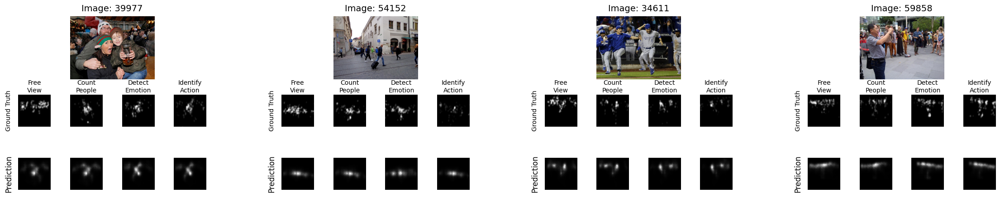

In [ ]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F
from PIL import Image

def visualize_row_of_fdm_maps(model_path, dataset, test_ds, image_ids):
    """
    Displays a 1×4 row of 3×4 panels for each image_id:
      • stimulus once (centered) with its ID above it,
      • a vertical "Ground Truth" label on the left of the GT row,
      • a vertical "Prediction" label on the left of the Pred row,
      • task names only on the GT row as column titles, wrapped onto two lines.
      • very tight vertical spacing between GT and Pred rows,
      • increased horizontal spacing to avoid title overlap.
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Load model once
    model = YOLOTaskSaliencyModel().to(device)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()

    # Precompute panels
    panels = []
    for img_id in image_ids:
        base = str(img_id)
        matched = [i for i,(p,_,_) in enumerate(dataset.samples)
                   if os.path.splitext(os.path.basename(p))[0] == base]
        assert len(matched) == 4, f"{base}: expected 4 tasks, got {len(matched)}"

        stim_np = np.array(
            Image.open(dataset.samples[matched[0]][0]).convert("RGB")
        )

        imgs, gt_maps, descs = [], [], []
        for idx in matched:
            sample = dataset[idx]
            imgs.append(sample["stimuli"])
            gt_maps.append(sample["fdm"].squeeze(0).numpy())
        imgs_t = torch.stack(imgs, dim=0).to(device)

        with torch.no_grad():
            preds = model(imgs_t, [""]*4)  # descriptions not needed for inference
            preds = F.interpolate(preds,
                                  size=gt_maps[0].shape,
                                  mode="bilinear",
                                  align_corners=False)
            pred_maps = preds.cpu().squeeze(1).numpy()

        panels.append((base, stim_np, gt_maps, pred_maps))

    # Task titles, wrapped onto two lines
    wrapped_titles = ["Free\nView", "Count\nPeople", "Detect\nEmotion", "Identify\nAction"]

    # Create figure
    fig = plt.figure(figsize=(24, 6))
    outer = fig.add_gridspec(1, len(panels), wspace=0.4)  # more horizontal space

    for col_idx, (base, stim_np, gt_maps, pred_maps) in enumerate(panels):
        inner = outer[0, col_idx].subgridspec(
            3, 4,
            height_ratios=[1, 1, 1],
            hspace=0.0,   # no gap between GT and Pred rows
            wspace=0.6    # wider gap between columns
        )

        # Row 0: stimulus centered in cols 1–2, ID above
        ax0 = fig.add_subplot(inner[0, 1:3])
        ax0.imshow(stim_np)
        ax0.set_title(f"Image: {base}", fontsize=14, pad=8)
        ax0.axis("off")
        for c in (0, 3):
            fig.add_subplot(inner[0, c]).axis("off")

        # Row 1: GT FDMs with wrapped titles
        gt_axes = []
        for i, title in enumerate(wrapped_titles):
            ax = fig.add_subplot(inner[1, i])
            ax.imshow(gt_maps[i], cmap="gray")
            ax.set_title(title, fontsize=10, pad=4)
            ax.axis("off")
            gt_axes.append(ax)
        gt_axes[0].text(
            -0.3, 0.5, "Ground Truth",
            va="center", ha="center", rotation="vertical",
            transform=gt_axes[0].transAxes, fontsize=10
        )

        # Row 2: Predicted FDMs
        pred_axes = []
        for i in range(4):
            ax = fig.add_subplot(inner[2, i])
            ax.imshow(pred_maps[i], cmap="gray")
            ax.axis("off")
            pred_axes.append(ax)
        pred_axes[0].text(
            -0.3, 0.5, "Prediction",
            va="center", ha="center", rotation="vertical",
            transform=pred_axes[0].transAxes, fontsize=12
        )

    # Tighten up the whole layout
    plt.subplots_adjust(top=0.85, bottom=0.15, left=0.05, right=0.95)
    plt.show()


# Usage example:
ckpt = "/content/drive/MyDrive/TDSP/models/tdsp_40epoch.pth"
ids  = [39977, 54152, 34611, 59858]
visualize_row_of_fdm_maps(ckpt, dataset, test_ds, ids)


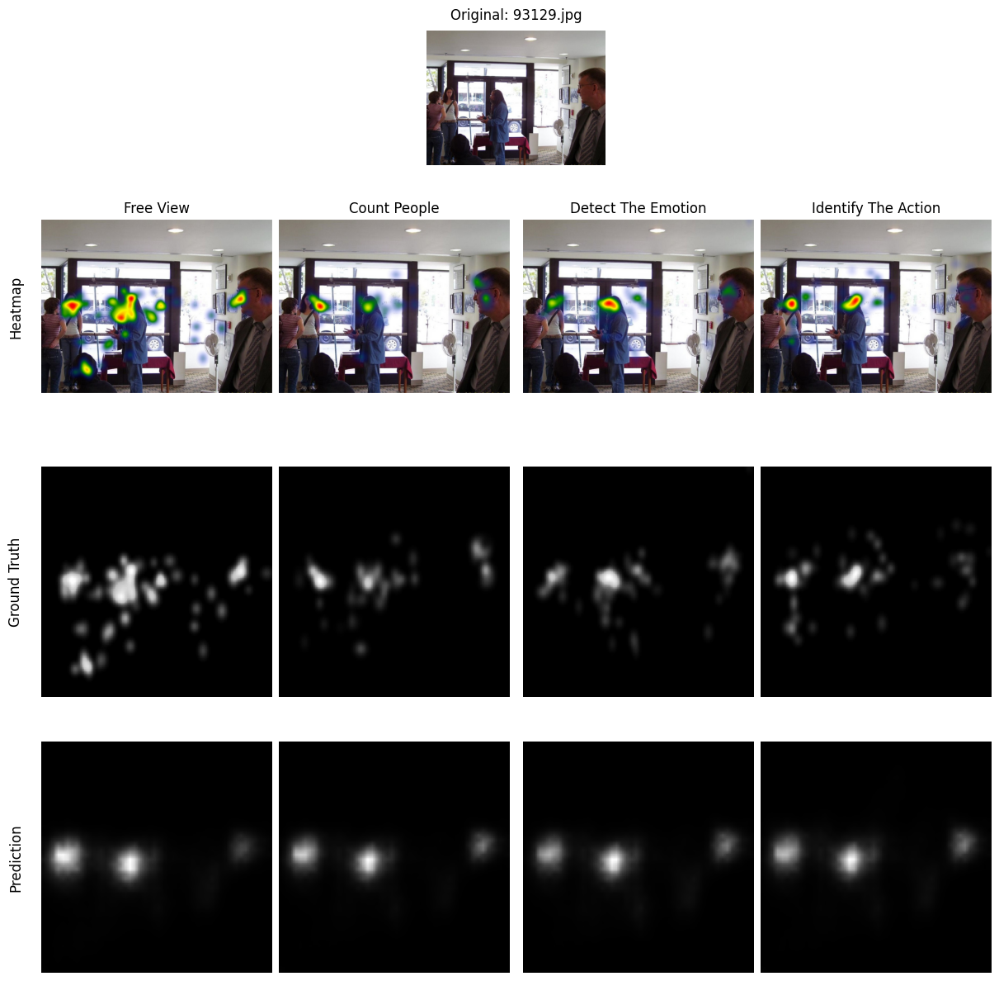

In [ ]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import torch
import torch.nn.functional as F

# 1) Sample a random entry from your dataset
idx, = random.sample(range(len(dataset)), 1)
stimuli_path, _, _ = dataset.samples[idx]
image_id          = os.path.basename(stimuli_path)
base_name         = os.path.splitext(image_id)[0]
orig_image        = Image.open(stimuli_path).convert("RGB")

# 2) Run inference for each task
inp  = dataset.transform(orig_image).unsqueeze(0).to(device)
outs = []
with torch.no_grad():
    for task in dataset.tasks:
        desc = task_mapping[task]
        out  = model(inp, [desc])            # [1,1,H1,W1]
        outs.append(out)
preds_raw = torch.cat(outs, dim=0)          # [4,1,H1,W1]

# 2.a) Determine GT size via your saliency_transform
gt_pil    = Image.open(os.path.join(DATA_PATH, dataset.tasks[0], "fdm", base_name + ".png"))
gt_tensor = dataset.saliency_transform(gt_pil)  # [1,H2,W2]
H2, W2    = gt_tensor.shape[-2:]

# 2.b) Resize preds → [4,1,H2,W2] & to NumPy FDMs
preds = F.interpolate(preds_raw, size=(H2, W2),
                      mode="bilinear", align_corners=False)
pred_maps = preds.squeeze(1).cpu().numpy()     # [4,H2,W2]

# 2.c) Load & resize your GTs
gt_maps = []
for task in dataset.tasks:
    gt_p = Image.open(os.path.join(DATA_PATH, task, "fdm", base_name + ".png")).convert("L")
    gt_t = dataset.saliency_transform(gt_p).squeeze(0).numpy()
    gt_maps.append(gt_t)

# 2.d) Load heatmaps (no resizing)
hm_maps = []
for task in dataset.tasks:
    hm = Image.open(os.path.join(DATA_PATH, task, "heatmap", base_name + ".png"))
    hm_maps.append(hm)

# Helper to hide ticks/spines but keep ylabel
def clean_axis(ax):
    ax.set_xticks([]); ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)

# 3) Plot layout: 4×4 grid, height_ratios to center the original
fig = plt.figure(constrained_layout=True, figsize=(12, 12))
gs  = fig.add_gridspec(4, 4, height_ratios=[1, 2, 2, 2])

# 3.a) Top row: original stimuli centered over cols 1–2
ax = fig.add_subplot(gs[0, 1:3])
ax.imshow(orig_image)
clean_axis(ax)
ax.set_title(f"Original: {image_id}", pad=10)

# 3.b) Rows 1–3: Heatmap, GT, Prediction
for col, task in enumerate(dataset.tasks):
    # Heatmap
    ax = fig.add_subplot(gs[1, col])
    ax.imshow(hm_maps[col])
    clean_axis(ax)
    if col == 0:
        ax.set_ylabel("Heatmap", rotation=90, size="large", labelpad=16)
    ax.set_title(task_mapping[task].title(), pad=6)

    # Ground Truth
    ax = fig.add_subplot(gs[2, col])
    ax.imshow(gt_maps[col], cmap="gray", interpolation="nearest")
    clean_axis(ax)
    if col == 0:
        ax.set_ylabel("Ground Truth", rotation=90, size="large", labelpad=16)

    # Prediction (as FDM)
    ax = fig.add_subplot(gs[3, col])
    ax.imshow(pred_maps[col], cmap="gray", interpolation="nearest")
    clean_axis(ax)
    if col == 0:
        ax.set_ylabel("Prediction", rotation=90, size="large", labelpad=16)

plt.show()


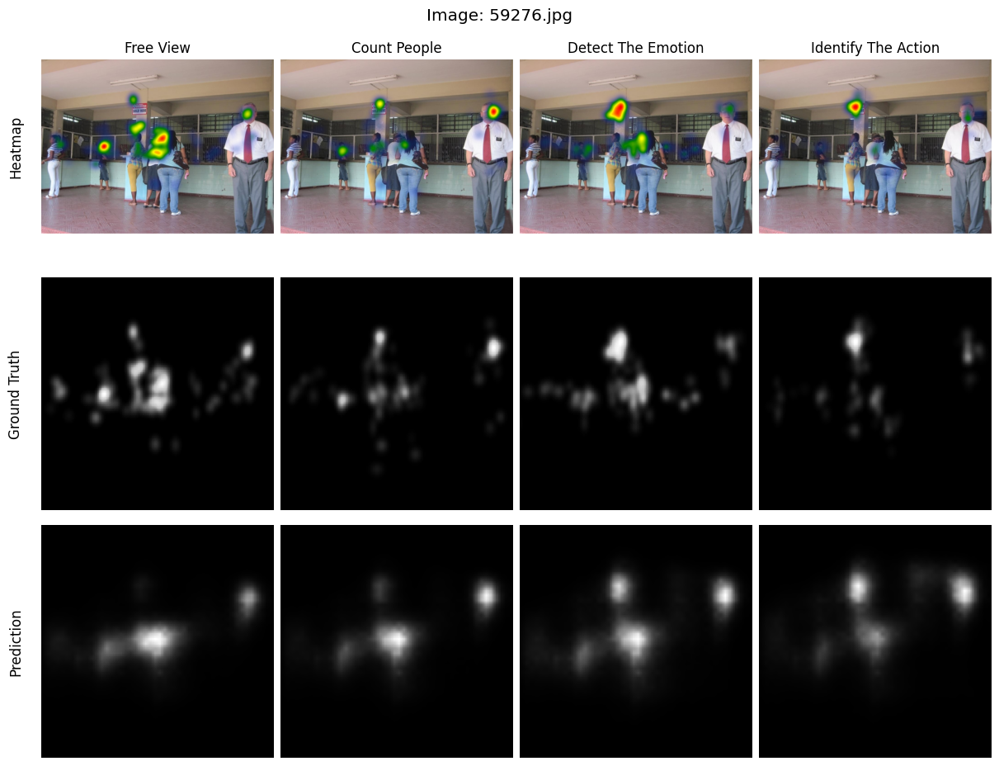

In [ ]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import torch
import torch.nn.functional as F

# 1) Sample a random entry from your dataset
idx, = random.sample(range(len(dataset)), 1)
stimuli_path, _, _ = dataset.samples[idx]
image_id          = os.path.basename(stimuli_path)
base_name         = os.path.splitext(image_id)[0]
orig_image        = Image.open(stimuli_path).convert("RGB")

# 2) Run inference for each task
inp  = dataset.transform(orig_image).unsqueeze(0).to(device)
outs = []
with torch.no_grad():
    for task in dataset.tasks:
        desc = task_mapping[task]
        out  = model(inp, [desc])            # [1,1,H1,W1]
        outs.append(out)
preds_raw = torch.cat(outs, dim=0)          # [4,1,H1,W1]

# 2.a) Determine GT size via your saliency_transform
gt_pil    = Image.open(os.path.join(DATA_PATH, dataset.tasks[0], "fdm", base_name + ".png"))
gt_tensor = dataset.saliency_transform(gt_pil)  # [1,H2,W2]
H2, W2    = gt_tensor.shape[-2:]

# 2.b) Resize preds → [4,1,H2,W2] & to NumPy FDMs
preds     = F.interpolate(preds_raw, size=(H2, W2), mode="bilinear", align_corners=False)
pred_maps = preds.squeeze(1).cpu().numpy()     # [4,H2,W2]

# 2.c) Load & resize your GTs
gt_maps = []
for task in dataset.tasks:
    gt_p = Image.open(os.path.join(DATA_PATH, task, "fdm", base_name + ".png")).convert("L")
    gt_t = dataset.saliency_transform(gt_p).squeeze(0).numpy()
    gt_maps.append(gt_t)

# 2.d) Load heatmaps
hm_maps = []
for task in dataset.tasks:
    hm = Image.open(os.path.join(DATA_PATH, task, "heatmap", base_name + ".png"))
    hm_maps.append(hm)

# Helper to hide ticks/spines but keep ylabel visible
def clean_axis(ax):
    ax.set_xticks([]); ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)

# 3) Plot 3×4 grid with vertical labels, and keep image_id as title
fig = plt.figure(constrained_layout=True, figsize=(12, 9))
fig.suptitle(f"Image: {image_id}", y=1.02, size="x-large")
gs  = fig.add_gridspec(3, 4)

# 3.a) Rows: 0=Heatmap, 1=Ground Truth, 2=Prediction
for col, task in enumerate(dataset.tasks):
    # Heatmap
    ax = fig.add_subplot(gs[0, col])
    ax.imshow(hm_maps[col])
    clean_axis(ax)
    if col == 0:
        ax.set_ylabel("Heatmap", rotation=90, size="large", labelpad=16)
    ax.set_title(task_mapping[task].title(), pad=6)

    # Ground Truth
    ax = fig.add_subplot(gs[1, col])
    ax.imshow(gt_maps[col], cmap="gray", interpolation="nearest")
    clean_axis(ax)
    if col == 0:
        ax.set_ylabel("Ground Truth", rotation=90, size="large", labelpad=16)

    # Prediction
    ax = fig.add_subplot(gs[2, col])
    ax.imshow(pred_maps[col], cmap="gray", interpolation="nearest")
    clean_axis(ax)
    if col == 0:
        ax.set_ylabel("Prediction", rotation=90, size="large", labelpad=16)

plt.show()


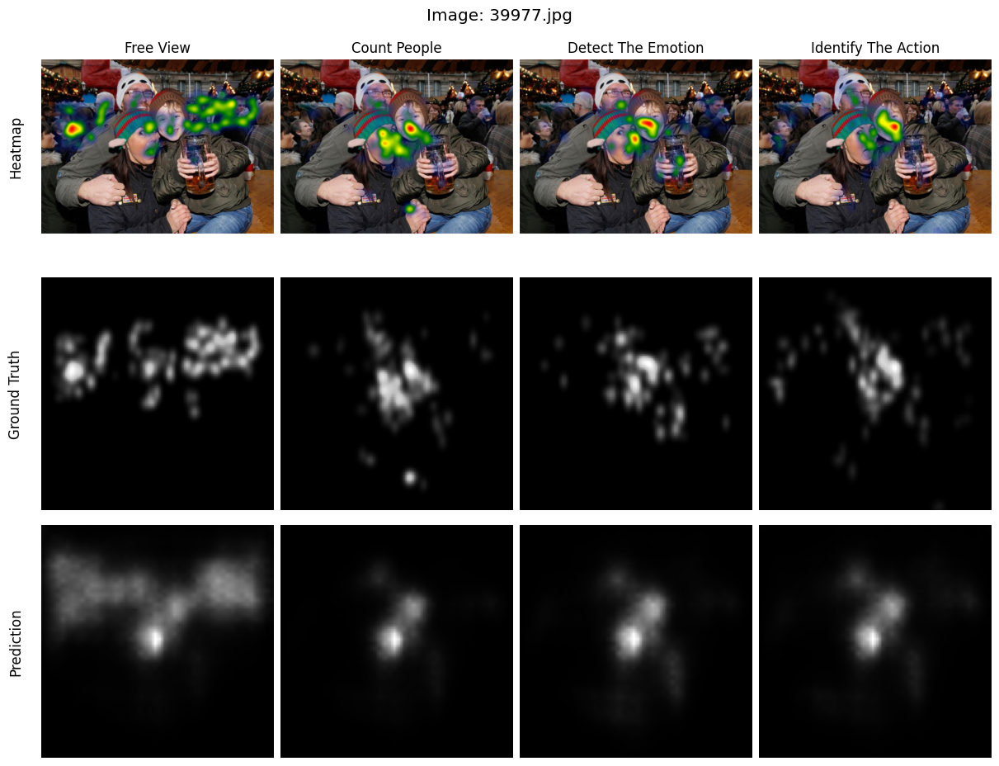

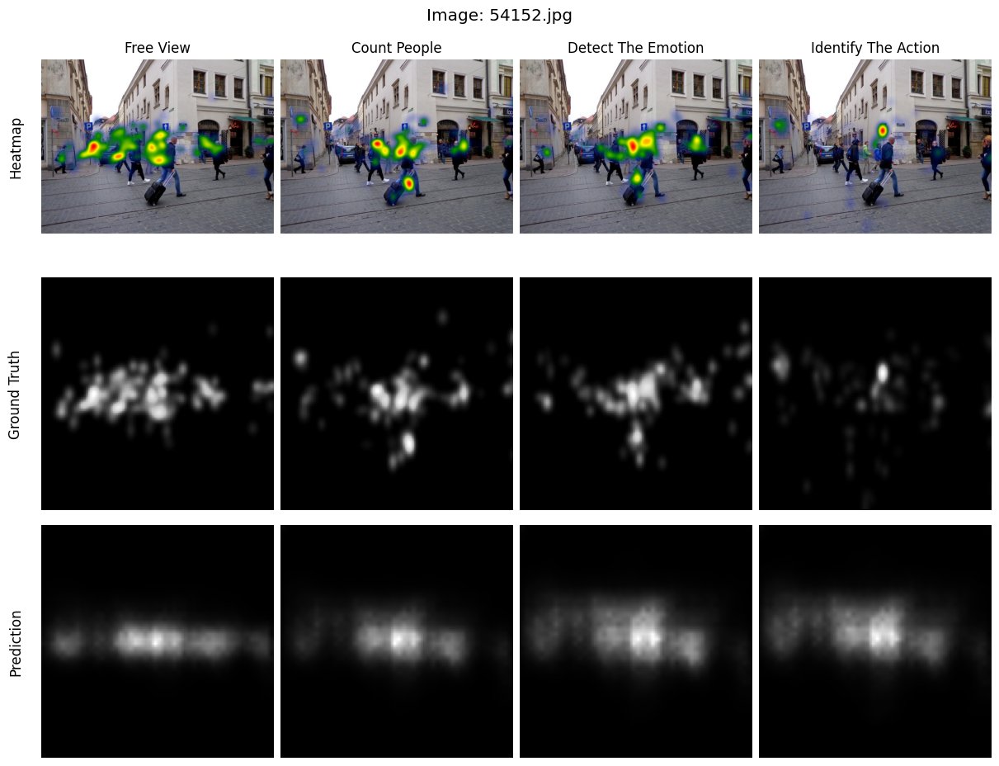

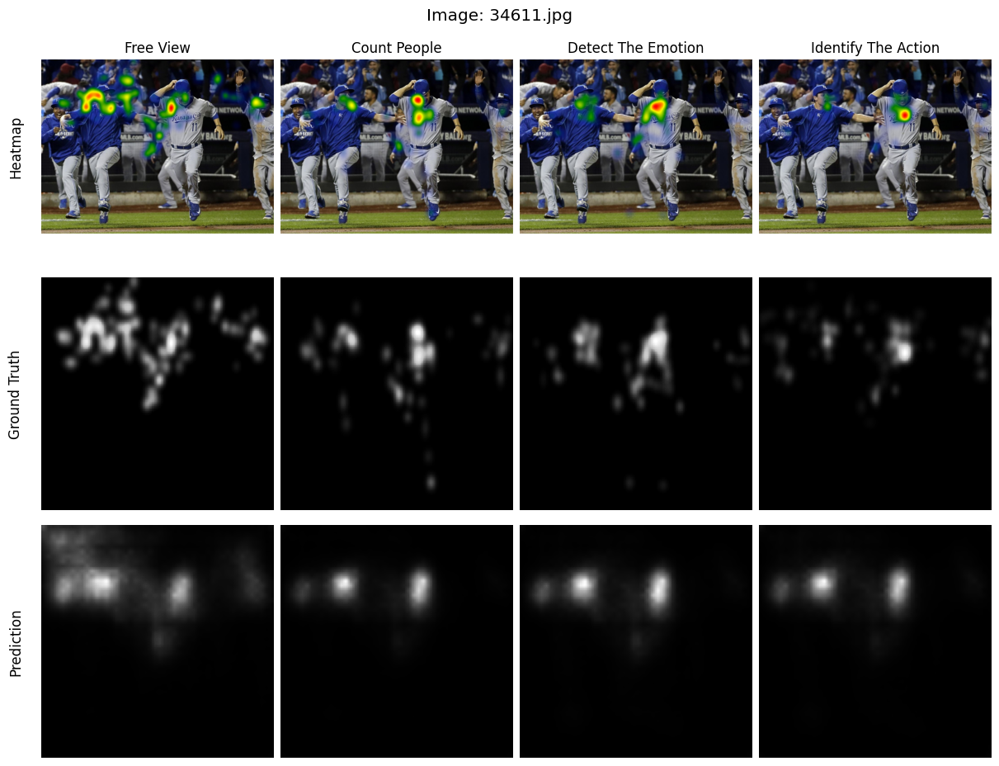

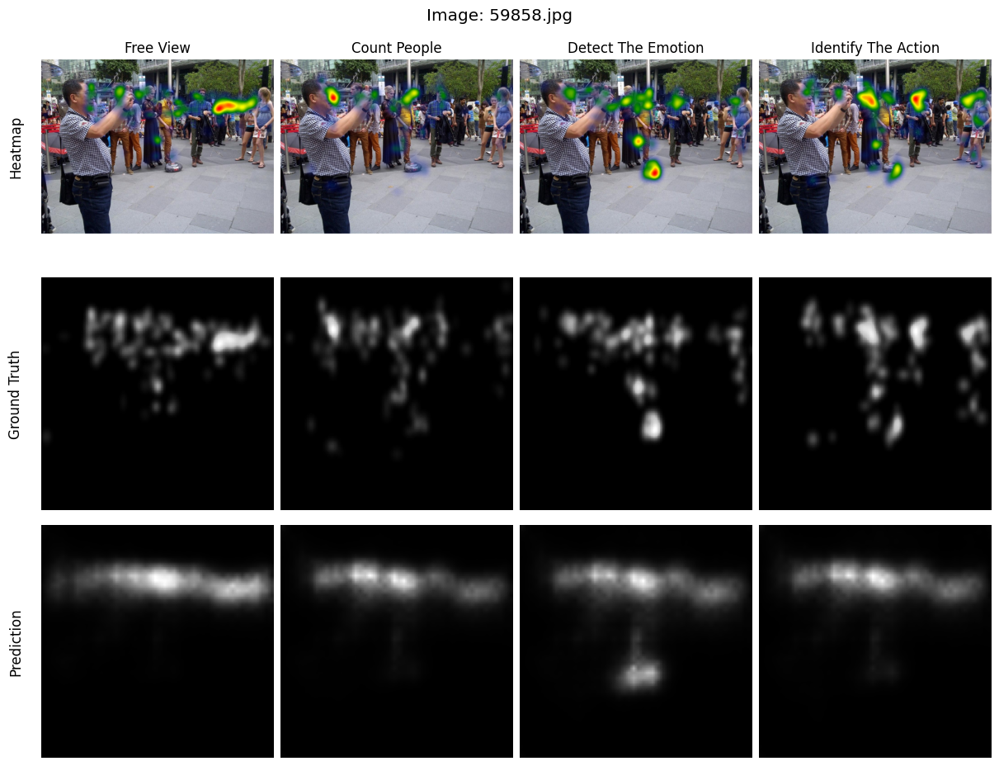

In [ ]:
import os
import glob
import random
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import torch
import torch.nn.functional as F

# List of IDs to visualize
ids = [39977, 54152, 34611, 59858]

# Helper to hide ticks/spines but keep ylabel visible
def clean_axis(ax):
    ax.set_xticks([]); ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)

for img_id_num in ids:
    # 1) Locate stimulus file (jpg or png)
    base_name    = str(img_id_num)
    pattern      = os.path.join(DATA_PATH, "stimuli", base_name + ".*")
    candidates   = glob.glob(pattern)
    assert candidates, f"No stimulus found for ID {base_name}"
    stimuli_path = candidates[0]
    image_id     = os.path.basename(stimuli_path)
    orig_image   = Image.open(stimuli_path).convert("RGB")

    # 2) Inference
    inp  = dataset.transform(orig_image).unsqueeze(0).to(device)
    outs = []
    with torch.no_grad():
        for task in dataset.tasks:
            desc = task_mapping[task]
            out  = model(inp, [desc])           # [1,1,H1,W1]
            outs.append(out)
    preds_raw = torch.cat(outs, dim=0)         # [4,1,H1,W1]

    # 2.a) Determine GT size via saliency_transform
    gt_pil    = Image.open(os.path.join(DATA_PATH, dataset.tasks[0], "fdm", base_name + ".png"))
    gt_tensor = dataset.saliency_transform(gt_pil)  # [1,H2,W2]
    H2, W2    = gt_tensor.shape[-2:]

    # 2.b) Resize preds → [4,1,H2,W2] & convert to NumPy
    preds     = F.interpolate(preds_raw, size=(H2, W2), mode="bilinear", align_corners=False)
    pred_maps = preds.squeeze(1).cpu().numpy()     # [4,H2,W2]

    # 2.c) Load & resize GTs
    gt_maps = []
    for task in dataset.tasks:
        gt_p = Image.open(os.path.join(DATA_PATH, task, "fdm", base_name + ".png")).convert("L")
        gt_t = dataset.saliency_transform(gt_p).squeeze(0).numpy()
        gt_maps.append(gt_t)

    # 2.d) Load heatmaps
    hm_maps = []
    for task in dataset.tasks:
        hm = Image.open(os.path.join(DATA_PATH, task, "heatmap", base_name + ".png"))
        hm_maps.append(hm)

    # 3) Plot 3×4 grid with vertical labels and image_id as title
    fig = plt.figure(constrained_layout=True, figsize=(12, 9))
    fig.suptitle(f"Image: {image_id}", y=1.02, size="x-large")
    gs  = fig.add_gridspec(3, 4)

    for col, task in enumerate(dataset.tasks):
        # Heatmap
        ax = fig.add_subplot(gs[0, col])
        ax.imshow(hm_maps[col])
        clean_axis(ax)
        if col == 0:
            ax.set_ylabel("Heatmap", rotation=90, size="large", labelpad=16)
        ax.set_title(task_mapping[task].title(), pad=6)

        # Ground Truth
        ax = fig.add_subplot(gs[1, col])
        ax.imshow(gt_maps[col], cmap="gray", interpolation="nearest")
        clean_axis(ax)
        if col == 0:
            ax.set_ylabel("Ground Truth", rotation=90, size="large", labelpad=16)

        # Prediction
        ax = fig.add_subplot(gs[2, col])
        ax.imshow(pred_maps[col], cmap="gray", interpolation="nearest")
        clean_axis(ax)
        if col == 0:
            ax.set_ylabel("Prediction", rotation=90, size="large", labelpad=16)

    plt.show()


Saving Unknown-19.png to Unknown-19 (1).png
Saving Unknown-20.png to Unknown-20 (1).png


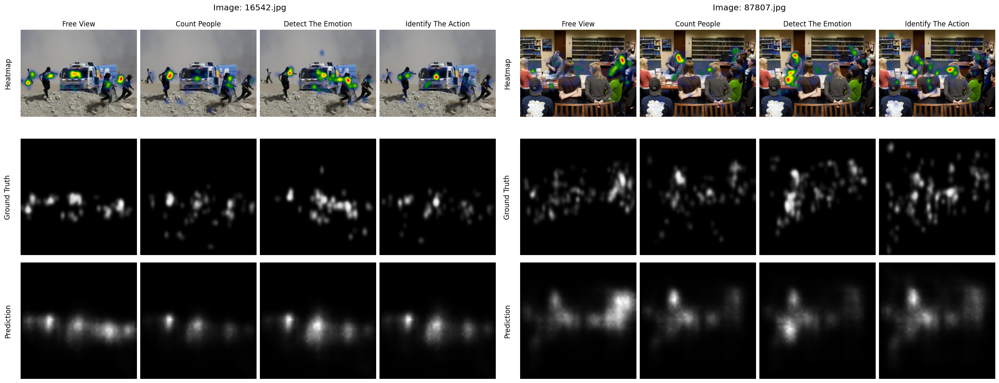

In [ ]:
from google.colab import files
from PIL import Image
from IPython.display import display

# upload two files
uploaded = files.upload()

# open
keys = list(uploaded.keys())
img1 = Image.open(keys[0]).convert("RGB")
img2 = Image.open(keys[1]).convert("RGB")

# fuse them
w, h = img1.width + img2.width, max(img1.height, img2.height)
combined = Image.new("RGB", (w, h))
combined.paste(img1, (0, 0))
combined.paste(img2, (img1.width, 0))

# display at native resolution
display(combined)


Saving Unknown-24.png to Unknown-24.png
Saving Unknown-25.png to Unknown-25.png
Saving Unknown-26.png to Unknown-26.png
Saving Unknown-27.png to Unknown-27.png


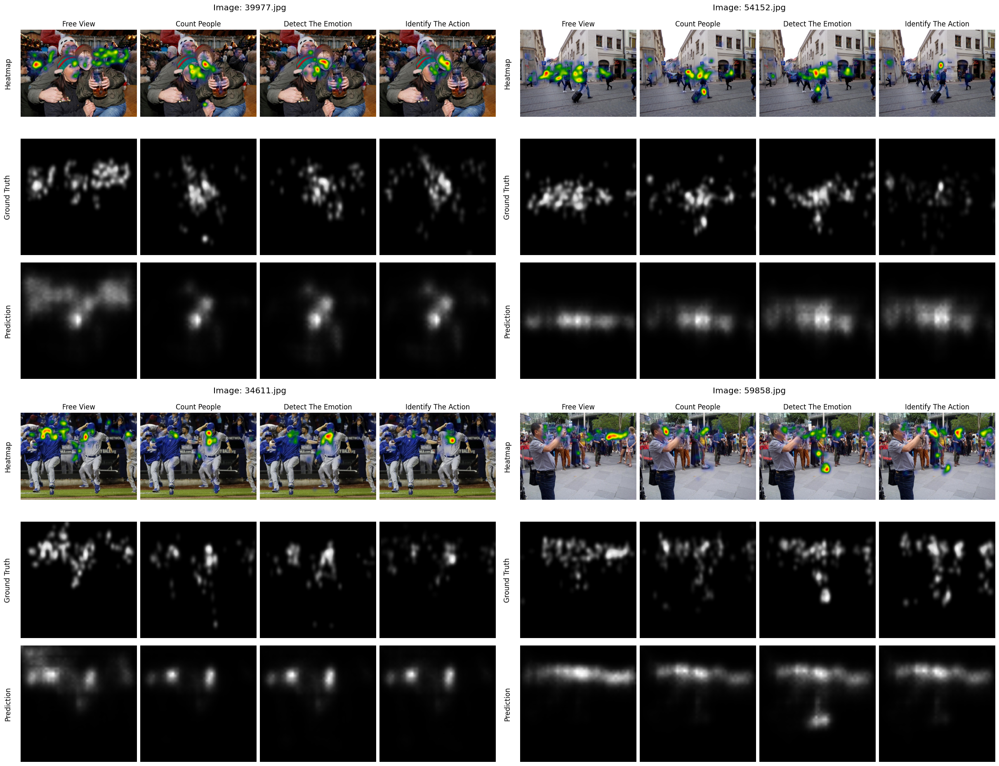

In [ ]:
from google.colab import files
from PIL import Image
from IPython.display import display

# 1) Upload four images
uploaded = files.upload()
# (Select up to four files in the dialog.)

# 2) Open the first four uploaded images
keys = list(uploaded.keys())[:4]
imgs = [Image.open(k).convert("RGB") for k in keys]

# 3) Compute grid dimensions (handles differing sizes)
#   ┌─────────┬─────────┐
#   │   img0  │  img1   │  row 0 heights = max of img0,img1
#   ├─────────┼─────────┤
#   │   img2  │  img3   │  row 1 heights = max of img2,img3
#   └─────────┴─────────┘
w0 = max(imgs[0].width,  imgs[2].width)
w1 = max(imgs[1].width,  imgs[3].width)
h0 = max(imgs[0].height, imgs[1].height)
h1 = max(imgs[2].height, imgs[3].height)

total_w = w0 + w1
total_h = h0 + h1

# 4) Create a new canvas and paste
combined = Image.new("RGB", (total_w, total_h))
combined.paste(imgs[0], (0,      0))   # top-left
combined.paste(imgs[1], (w0,     0))   # top-right
combined.paste(imgs[2], (0,      h0))  # bottom-left
combined.paste(imgs[3], (w0,     h0))  # bottom-right

# 5) Display at native resolution
display(combined)


### Evaluate model performance

In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
from sklearn.metrics import roc_auc_score

def correlation_coefficient(pred: torch.Tensor, gt: torch.Tensor, eps: float = 1e-12) -> torch.Tensor:
    """
    Pearson’s correlation between two maps of shape [H, W].
    """
    p = pred.view(-1)
    g = gt.view(-1)
    p_mean = p.mean()
    g_mean = g.mean()
    num = ((p - p_mean) * (g - g_mean)).sum()
    den = torch.sqrt(((p - p_mean)**2).sum() * ((g - g_mean)**2).sum()).clamp(min=eps)
    return num / den

def kl_divergence(pred: torch.Tensor, gt: torch.Tensor, eps: float = 1e-12) -> torch.Tensor:
    """
    KL divergence treating each map as a discrete PDF over H×W.
    """
    # normalize
    p = pred.clamp(min=0)  # ensure non-negative
    p = p / (p.sum() + eps)
    g = gt / (gt.sum() + eps)
    return (g * torch.log((g + eps) / (p + eps))).sum()

def nss_score(pred: torch.Tensor, fixation_map: torch.Tensor) -> float:
    pred = pred.view(-1).cpu().numpy()
    fixation = fixation_map.view(-1).cpu().numpy()
    if fixation.sum() == 0:
        return float("nan")
    pred = (pred - pred.mean()) / (pred.std() + 1e-8)
    return np.mean(pred[fixation > 0])

def similarity_score(pred: torch.Tensor, gt: torch.Tensor) -> float:
    p = pred.view(-1)
    g = gt.view(-1)
    p = p / (p.sum() + 1e-8)
    g = g / (g.sum() + 1e-8)
    return torch.min(p, g).sum().item()

def auc_borji(pred: torch.Tensor, fixation_map: torch.Tensor, n_splits=100) -> float:
    pred = pred.view(-1).cpu().numpy()
    fixation = fixation_map.view(-1).cpu().numpy()
    if fixation.sum() == 0:
        return float("nan")
    sal_fix = pred[fixation > 0]
    sal_nonfix = pred[fixation == 0]

    if len(sal_nonfix) == 0:
        return float("nan")

    aucs = []
    for _ in range(n_splits):
        sampled_neg = np.random.choice(sal_nonfix, size=len(sal_fix), replace=False)
        labels = np.concatenate([np.ones(len(sal_fix)), np.zeros(len(sampled_neg))])
        scores = np.concatenate([sal_fix, sampled_neg])
        aucs.append(roc_auc_score(labels, scores))
    return np.mean(aucs)

In [ ]:
def evaluate_saliency_model(model, loader, device):
    """
    Runs the model on every batch in `loader`, computes CC, KLD, NSS, SIM, AUC-Borji per-sample,
    and returns their averages.
    """
    model.to(device).eval()
    cc_list, kld_list = [], []
    nss_list, sim_list, auc_list = [], [], []

    with torch.no_grad():
        for batch in loader:
            imgs = batch["stimuli"].to(device)
            gts  = batch["fdm"].to(device)
            descs = batch["task_description"]

            preds = model(imgs, descs)
            preds = F.interpolate(preds, size=gts.shape[-2:], mode='bilinear', align_corners=False)

            B = preds.size(0)
            for i in range(B):
                pred = preds[i, 0]
                gt = gts[i, 0]
                fix_map = (gt > 0.5).float()  # binary fixation map

                cc_list.append(correlation_coefficient(pred, gt).item())
                kld_list.append(kl_divergence(pred, gt).item())
                sim_list.append(similarity_score(pred, gt))
                nss_list.append(nss_score(pred, fix_map))
                auc_list.append(auc_borji(pred, fix_map))

    # Compute averages
    avg_cc  = sum(cc_list)  / len(cc_list)  if cc_list else float("nan")
    avg_kld = sum(kld_list) / len(kld_list) if kld_list else float("nan")
    avg_sim = sum(sim_list) / len(sim_list) if sim_list else float("nan")
    avg_nss = sum(nss_list) / len(nss_list) if nss_list else float("nan")
    avg_auc = sum(auc_list) / len(auc_list) if auc_list else float("nan")

    print(f"Average CC:         {avg_cc:.4f}")
    print(f"Average KLDiv:      {avg_kld:.4f}")
    print(f"Average Similarity: {avg_sim:.4f}")
    print(f"Average NSS:        {avg_nss:.4f}")
    print(f"Average AUC-Borji:  {avg_auc:.4f}")

    return {
        "CC": avg_cc, "KL": avg_kld,
        "SIM": avg_sim, "NSS": avg_nss, "AUC-Borji": avg_auc
    }

In [ ]:
model.load_state_dict(torch.load("/content/drive/MyDrive/TDYSN/models/tdsp_50epoch.pth"))
metrics = evaluate_saliency_model(model, test_loader, device)

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Average CC:         0.6423
Average KLDiv:      0.9270
Average Similarity: 0.5010
Average NSS:        3.4583
Average AUC-Borji:  0.9486


In [ ]:
model.load_state_dict(torch.load("/content/drive/MyDrive/TDYSN/models/tdsp_50epoch.pth"))
metrics = evaluate_saliency_model(model, val_loader, device)

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Average CC:         0.6516
Average KLDiv:      0.9132
Average Similarity: 0.5006
Average NSS:        3.6885
Average AUC-Borji:  0.9549
